# Estudo de rotina do repositório 
## <font color = 'turquoise'> *Hyperspectral Analysis: Fungus and R. Microplus* em python

  Autor: Adriel Lenner Vinhal Mori

  Link para o repositório Git
  - [Git - ht4m](https://github.com/dvlucena/ht4m)
  - [Git - Adriel Mori](https://github.com/adrielmori)
  - [Git Bactérias - Ricardo](https://github.com/artsousa/HyperSI)

Visualização das amostras e processos:
  - [Ht4m-master_Adriel](https://colab.research.google.com/drive/1UXdp-8a-LMFlnS2XxtHMPqiJEFaW3cYO?usp=sharing)

Bibliografia e materiais
  - [Dimensionality Reduction on HSI](https://https://colab.research.google.com/drive/1Lstx55MxHT8bpXlgnaXYloVCmagE_xC7?usp=sharing#scrollTo=xjpDyNm3fKMt)

  - [Hyperspectral Image Analysis — Classification](https://towardsdatascience.com/hyperspectral-image-analysis-classification-c41f69ac447f)

In [112]:
import scipy.io
import numpy as np
import pandas as pdy

import h5py
import json

import os
import sys
import glob
# import earthpy as et
import spectral as sp
# import earthpy.spatial as es
# import earthpy.plot as ep
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
from random import sample
from IPython.core.pylabtools import figsize

from mpl_toolkits import mplot3d
import numpy as np
from joblib import dump, load
import numpy.matlib
import pandas as pd
from mpl_toolkits.mplot3d import axes3d
from sklearn.cluster import KMeans
import pickle
# from spectral import *

from math import factorial
from sklearn.decomposition import PCA
from scipy.signal import savgol_filter
from sklearn.preprocessing import MinMaxScaler

import pprint
import seaborn as sn

import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# import cv2

sp.settings.envi_support_nonlowercase_params = True

%matplotlib inline

In [113]:
#Create a matrix of indices, according to the idx and rmv of the sample
def rev_idx_array(idx, rmv, shape=None, tfill=None):
    if shape is None:
        out = np.zeros(idx.shape[0] + rmv.shape[0])
    else:
        out = np.zeros(shape)

    out[rmv] = 0

    if tfill is not None:
        for i, row in enumerate(idx):
            out[row] = tfill[i]
    else:
        out[idx] = 1

    return out.astype(int)

#
def sum_idx_array(idx):
      ind_r = []
      for i, (j, ind) in enumerate(zip(idx, np.arange(idx.shape[0]))):
          if j != ind:
              ind_r.append(i)

      return np.delete(idx, ind_r), np.array(ind_r)
#
#Retorna o rotulo de cada pixel ao seu correpondente clustercluster
#É executado empregando as classes com os algoritmos PCA e K-means

def hsiRemoveBackground(key, X = None, PCS = None): 
    if 'Fungo' in key:
      aux_cube=hsi2matrix(X)
    else: 
      aux_cube=hsi2matrix(X)[:,100:200]

    scores = PCA(n_components=PCS).fit_transform(aux_cube)
    # 'n_components()'Número de componentes a serem mantidos.
    #se n_components não estiver definido, todos os componentes serão mantidos

    # 'fit_transform()' Ajusta o modelo com X e aplique a redução de dimensionalidade em X.

    #Retorna a matriz com a remoção do fundo
    return  KMeans(n_clusters=2, init='k-means++', n_init=5, max_iter=300).fit(scores).labels_

#
def hex2rgb(value):
  return tuple(int(value.lstrip('#')[i:i + 2], 16) for i in (0, 2, 4))

#
def realIdx(idx, c):
      out = np.arange(idx.shape[0])
      for idx, (rid, vec) in enumerate(zip(out, idx)):
          if vec != c:
              out[idx] = -1
      out[out == -1] = 0

      return out

#
def hsi2matrix(matrix: np.ndarray):
  return matrix.T.reshape((matrix.shape[1] * matrix.shape[2], matrix.shape[0]), order='F')

#
def rgbscale(image):
  return (image * 255).astype(np.uint8)

#
def getClusters(image = None,INDEX = None, c = None, rgb = None):
      ind = realIdx(INDEX, c)
      out_i = np.concatenate((ind, ind, ind), axis=0).reshape((3, *(image.shape[:2])))

      if len(image.shape) == 2:
          image = MinMaxScaler(feature_range=(0, 1)).fit_transform(image)
          image = np.stack((image, image, image), axis=2)

      image[out_i[0] != 0, 0] = rgb[0]
      image[out_i[1] != 0, 1] = rgb[1]
      image[out_i[2] != 0, 2] = rgb[2]

      return image

#Moving the matrix axes to work with the bands
def moveAxis(data):
  data = np.moveaxis(data, 2, 0)
  # ep.plot_rgb(data, title='Visualizando amostra', figsize=(8, 4))
  # plt.show()

  return data

#
def plot_clusters(out_i, out_i2, key, tam):
      
      if tam>300:
        fig = plt.figure(figsize=(9, 9))
      if tam<300:
        fig = plt.figure(figsize=(9, 6))

      rows = 1
      columns = 2
      
      fig = plt.figure(figsize=(14, 6))
      fig.add_subplot(rows, columns, 1)
      plt.imshow(out_i)
      # plt.axis('off')
      plt.title("1")
      fig.add_subplot(rows, columns, 2)
      plt.imshow(out_i2)
      # plt.axis('off')
      plt.title("2")
      plt.suptitle(key, fontsize=20)
      plt.show()

      # fig.add_subplot(rows, columns, 3)
      # plt.imshow(out_i3)
      # plt.title("3")
      # plt.suptitle(key, fontsize=20)
      # plt.show()

      # fig.add_subplot(rows, columns, 4)
      # plt.imshow(out_i4)
      # plt.title("4")
      # plt.suptitle(key, fontsize=20)
      # plt.show()
#
def getData(data_path):
  data = {}

  ways = [os.path.join(data_path, nome) for nome in os.listdir(data_path)]
  files = [arq for arq in ways if os.path.isfile(arq)]
  files = [arq for arq in files if arq.lower().endswith(".raw")]

  for i,f in zip(range(len(files)),files):
    basename = os.path.basename(files[i])
    file_name = os.path.splitext(basename)[0]

    f = scipy.io.loadmat(f).get(file_name)
    data[file_name] = f #loading datas individually
    # print(data_banana[file_name].shape)
  
  del(data['casca_marmelo'])

  #Setting as sample for training and testing split
  #rotating the pixel values ​​to balance the training and testing space
  rotate_pp = np.rot90(np.rot90(data['polpa_prata']))
  data['polpa_prata'] = rotate_pp

  rotate_pm = np.rot90(np.rot90(data['polpa_maca']))
  data['polpa_maca'] = rotate_pm

  return data

#Processing the sampled image in HSI resulting in images processed in RGB from the
#species of banana
def hsiImageProcess(DATA = None): 
    list_inds = {}
    list_sample_clusters = {}
    list_rm = {}

    for key in DATA.keys():
      # print(DATA[key].shape, '----->', key)

      CUBE = DATA[key]
      # CUBE = moveAxis(CUBE)
      INDEX = hsiRemoveBackground(key, CUBE, 2) + 1
      image = CUBE[200,:,:]

      out_i = getClusters(image, INDEX, 1, (1, 0, 0))
      out_i2 = getClusters(image, INDEX, 2, (0, 1, 0))
      # out_i3 = getClusters(image, INDEX, 3, (0, 0, 1))
      # out_i4 = getClusters(image, INDEX, 4, (1, 0, 1))

      fig = plt.figure(figsize=(7, 7))

      tam=len(CUBE[:][:][0])
      plot_clusters(out_i,out_i2, key, tam)
      # break

      cluster = input('Is the cluster of interest red-1 or green-2?\n')
      line = '_'
      print(line*125, '\n')

      list_inds[key], list_rm[key] = sum_idx_array(realIdx(INDEX, int(cluster)))

      #Apply values ​​of 0 and 1 to differentiate label and background
      list_sample_clusters[key] = rev_idx_array(list_inds[key], list_rm[key])

      out_i_result = getClusters(image, list_sample_clusters[key], 1, (1, 0, 0))
      plt.imshow(out_i_result)
      plt.show()
      print(list_inds[key], list_rm[key].shape, list_sample_clusters[key].shape)

    return list_inds, list_sample_clusters

In [114]:
import sample as Sample
# import pipeline
# import utils
import __init__
# import hsiroutine

In [115]:
def mean_from_3d(matrix: np.ndarray, ndims=2, axis=1):
    """
        Retornar o espectro médio da amostra 3D
        matriz: hipercubo (x, y, z)
        
        Parâmetros: 
            - matriz: A matriz em formato numpy
            - ndims: Número de dimensões
            - axis: O eixo da matriz x ao longo do qual o filtro deve ser aplicado
        Retorno
            - A média da matriz 3D
    """
    mean = np.mean(matrix, axis=axis).astype(np.float64)
    if ndims == 3:
        return mean.reshape((mean.shape[0], 1, mean.shape[1]))

    return mean

def raw2mat(image: Sample, white: Sample, dark: Sample, inplace=True):
    """
      Normaliza a amostra usando o Dark (0% Reflectance) e
      Referências brancas (100% de refletância), usando a equação:
      -log10((S - D)/(W - D))
      
      Parâmetros: 
          - image: A própria amostra sample, arquivo .hdr
          - white: Referência do branco, arquivo WHITEREF
          - dark: Referência do preto, arquivo DARKREF
          - inplace: significa altera o comportamento padrão, de modo que a operação no 
          dataframe não retorna nada, em vez disso, 'modifica os dados subjacentes'
          
      Funções: 
          extract_lines: Retorna somente as linhas obtidas na matrix
              - Parâmetros: A própria matriz e a quantidade de linhas. 
              - Retorno: Quantidade de linhas na matriz
          replace_median: Retorna matriz com a nova média substituída (verificando os locais na matriz em que são 
                          zero e substituindo pela próxima posição. 
              - Parâmetros: A própria matriz
              - Retorno: A matriz com valores substituidos da média
      Retorno: 
          - Matriz normalizada
    """
    def extract_lines(matrix, lines):
        rows = matrix.shape[1]
        return matrix[:, np.arange(0, rows, np.ceil(rows / lines)).astype(int), :]

    def replace_median(matrix):
        [_, rows, cols] = matrix.shape
        for z, x, y in zip(*np.where(matrix == 0)):
            if 0 < x < rows and 0 < y < cols:
                window = matrix[z, x - 1:x + 2, y - 1:y + 2]

                if len(np.where(window == 0)[0]) == 1:
                    matrix[z, x, y] = np.median(window[(window != 0)])

            return matrix

    extracted_dark = extract_lines(dark.sample, 25)
    extracted_white = extract_lines(white.sample, 25)

    raw_dark = mean_from_3d(matrix=extracted_dark, ndims=3, axis=1)
    raw_white = mean_from_3d(matrix=extracted_white, ndims=3, axis=1)
    raw_image = image.sample

    with np.errstate(divide='ignore', invalid='ignore'):
      pabs = np.nan_to_num(((raw_image - raw_dark) / (raw_white - raw_dark)), nan=0.0)

    normalized = replace_median(-np.log10((pabs * (pabs > 0)), where=(pabs > 0)))

    if inplace:
      image.normalized = normalized
      return

    return normalized

In [116]:
folder='C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/'
folder_data=folder+'data/'
samples_dict ={}
fungus_dict ={}

cont=0
for paths in glob.glob(folder_data+'*/capture/'):
  for diretorio, subpastas, arquivos in os.walk(paths):
    list_sample=[]
    name_file=diretorio.split('\\')[1]
    # name_file=diretorio.split('/')[-3]
    # line1='_'.join(name_file)
    if  len(arquivos) < 6: #for incomplete samples
      print(arquivos)
      continue
    else:
      for arquivo in arquivos:
        if arquivo.lower().endswith(".hdr"):
          dest=diretorio+arquivo
          list_sample.append(dest)
          
    if 'Meio' in name_file or 'Fungo' in name_file:
      fungus_dict[name_file] = list_sample
    else:
      samples_dict[name_file] = list_sample

In [126]:
import os
import pickle
import spectral as sp
from spectral import *

sp.settings.envi_support_nonlowercase_params = True


""" 
    Class Sample responsável por preparar os arquivos obtidos em Utils e gerar os hipercubos necessários. 
    Os arquivos gerados pela câmera (DARK, WHITE e .hdr) seguem a estrutura de arquivos dentro a "capture" e são 
    passados para o formato numpy.
 
 """

class Sample:
    def __init__(self, path, sample_name, inter='capture',
                 sample_prefix=None,
                 to_numpy_format=True):

        self.path = os.path.join(path, sample_name, (inter if inter else ''))
        self.sample_name = (sample_prefix if sample_prefix else '') + sample_name
        # print(self.path +'/'+ self.sample_name + '.hdr')


        self.image = None
        self.sample = None
        self.processed = None
        self.normalized = None
        self.sample_cluster = None
        
        self._read_image(to_numpy_format)

    def _read_image(self, to_numpy_format):
        """
            imagem armazena uma classe do pacote Spectral
            sample armazena um array numpy com 3 dimensões (comprimento de onda x linhas x colunas)
        """
        try:
            self.image = envi.open(os.path.join(self.path +'/'+ self.sample_name + '.hdr'))
            self.sample = self.image.load()

            if to_numpy_format:
                self.sample = self.sample.transpose(2, 0, 1)
                # print(self.sample)

        except Exception as e:
            print(e)

    def save(self):
        """
            salvar a imagem normalizada
        """
        sample_path = os.path.join(self.path, self.sample_name)
        sample_file = sample_path + '.pkl'

        with open(sample_file, 'wb') as destination_dir:
            pickle.dump(self, destination_dir, -1)

    @property
    def image(self):
        return self.__image

    @image.setter
    def image(self, var):
        self.__image = var

    @property
    def sample(self):
        return self.__sample

    @sample.setter
    def sample(self, var):
        self.__sample = var

    @property
    def normalized(self):
        return self.__normalized

    @normalized.setter
    def normalized(self, var):
        self.__normalized = var

    @property
    def processed(self):
        return self.__processed

    @processed.setter
    def processed(self, var):
        self.__processed = var

    @property
    def sample_cluster(self):
        return self.__sample_cluster

    @sample_cluster.setter
    def sample_cluster(self, var):
        self.__sample_cluster = var


if __name__ == '__main__':
    sample = Sample(folder_data, list(samples_dict.keys())[0])

    print(sample.image.shape)
    print('done')

(2856, 320, 256)
done


In [119]:
def snv(matrix: np.array):
    """
      Standard Normal Variate (SNV). 
      
      Parâmetros: 
          - matrix: Matriz em formato numpy
      Retorno: 
          - Matriz normalizada conforme SNV
    """
    out = np.zeros_like(matrix)
    for i in range(matrix.shape[0]):
       out[i, :] = (matrix[i, :] - np.mean(matrix[i, :])) / np.std(matrix[i, :])
    return out


def sgolay(matrix: np.ndarray, order=2, window=21, derivative=1, mode='wrap'):
    """
        Savitzky-Golay filter
    """
    return savgol_filter(matrix, window, order, deriv=derivative, mode=mode)

def hsi2matrix(matrix: np.ndarray):
      """ 
          Reorganizar a matriz 3D para que cada pixel se torne um
          linha na matriz retornada 2D
          
          Parâmetros: 
              - matriz: Hipercubo em formato numpy
          Retorno: 
              - Matriz convertida em bidimensional
      """
      return matrix.T.reshape((matrix.shape[1] * matrix.shape[2], matrix.shape[0]), order='F')

def normalize_mean(matrix: np.ndarray):
      """
        Centralizar os dados em 0 com a média
        
        Parâmetros: 
            - matrix: Matriz com formato numpy
        Retorno: 
            - Matriz normalizada
      """

      out = np.zeros_like(matrix)
      for i in range(matrix.shape[0]):
          out[i, :] = (matrix[i, :] - np.mean(matrix[i, :]))

      return out

def _signal_filter(sample, order=2, window=21, dv=1, mode='constant'):
        
      """ 
        A função "_signal_filter" aplica o métodos para filtrar, normalizar e suavizar as imagens.
        
          Parâmetros: 
              - Sample: amostras das bactérias.
            
          Retorno: 
              - Matrix filtrada. 
      """

      # print(sample.shape,type(sample))
      matrix = hsi2matrix(sample)
      matrix = normalize_mean(matrix)
      matrix = sgolay(matrix=matrix, order=order, window=window, derivative=dv, mode=mode)

      return snv(matrix=matrix)

def _signal_filter_NonSNV(sample, order=2, window=21, dv=1, mode='constant'):
        
      """ 
        A função "_signal_filter" aplica o métodos para filtrar, normalizar e suavizar as imagens.
        
          Parâmetros: 
              - Sample: amostras das bactérias.
            
          Retorno: 
              - Matrix filtrada. 
      """

      # print(sample.shape,type(sample))
      matrix = hsi2matrix(sample)
      matrix = normalize_mean(matrix)

      return sgolay(matrix=matrix, order=order, window=window, derivative=dv, mode=mode)

## IMAGE PROCESS

In [127]:
dict_cube={}

for idx, sample in enumerate(list(samples_dict.keys())):
  # print(sample, idx)

  name_file=sample.split('_')
  name_sample='_'.join(name_file[:-1])
  
  sample_path = os.path.join(folder, 'normalized/Rmicroplus/', name_sample)
  
  if os.path.isfile(sample_path + f'/{name_sample}.pkl'):
    print(f"{name_sample} normalized and save")
    continue
  
  os.makedirs(sample_path, exist_ok=True)
  sample_file = sample_path + f'/{name_sample}.pkl'

  data_sample = Sample(folder, sample)
  darkref = Sample(folder, sample, sample_prefix='DARKREF_')
  whiteref = Sample(folder, sample, sample_prefix='WHITEREF_')

  data_sample.normalized = raw2mat(image=data_sample, dark=darkref, white=whiteref, inplace=False)

  matrix=_signal_filter(data_sample.normalized)

  rows, cols = data_sample.normalized.shape[1:]
  
  ## Matrix to HSI Cube
  dict_cube[name_sample] = matrix.T.reshape(-1, rows, cols)
  
  # scipy.io.savemat(os.makedirs(os.path.join(folder+f'nomalized/{name_sample}.mat'), exist_ok=True), cube)
  """
    salvar a imagem normalizada
  """
  with open(sample_file, 'wb') as destination_dir:
      pickle.dump(dict_cube[name_sample], destination_dir, -1)

  print('Done: ', name_sample)
  

Unable to locate file "C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/Rmicroplus_Controe_Zero_1_221221-161359\capture/Rmicroplus_Controe_Zero_1_221221-161359.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/Rmicroplus_Controe_Zero_1_221221-161359\capture/DARKREF_Rmicroplus_Controe_Zero_1_221221-161359.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/Rmicroplus_Controe_Zero_1_221221-161359\capture/WHITEREF_Rmicroplus_Controe_Zero_1_221221-161359.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


AttributeError: 'NoneType' object has no attribute 'shape'

In [123]:
dict_cube={}

for idx, sample in enumerate(list(samples_dict.keys())):
  # print(sample, idx)

  name_file=sample.split('_')
  name_sample='_'.join(name_file[:-1])
  
  sample_path = os.path.join(folder, 'normalized_2/Rmicroplus/', name_sample)
  
  if os.path.isfile(sample_path + f'/{name_sample}.pkl'):
    print(f"{name_sample} normalized and save")
    continue
  
  os.makedirs(sample_path, exist_ok=True)
  sample_file = sample_path + f'/{name_sample}.pkl'

  data_sample = Sample(folder, sample)
  darkref = Sample(folder, sample, sample_prefix='DARKREF_')
  whiteref = Sample(folder, sample, sample_prefix='WHITEREF_')
  
  ## Matrix to HSI Cube
  dict_cube[name_sample] = data_sample.normalized
  
  # scipy.io.savemat(os.makedirs(os.path.join(folder+f'nomalized/{name_sample}.mat'), exist_ok=True), cube)
  """
    salvar a imagem normalizada
  """
  with open(sample_file, 'wb') as destination_dir:
      pickle.dump(dict_cube[name_sample], destination_dir, -1)

  print('Done: ', name_sample)
  

  
## Normalizando dados dos fungos
dict_cube_fugus={}

for idx, sample in enumerate(list(fungus_dict.keys())):
  # print(sample, idx)
  
  name_file=sample.split('_')
  name_sample='_'.join(name_file[:-1])
  
  sample_path = os.path.join(folder, 'normalized_2/Fungus/', name_sample)
  
  if os.path.isfile(sample_path + f'/{name_sample}.pkl'):
    print(f"{name_sample} normalized and save")
    continue
  
  os.makedirs(sample_path, exist_ok=True)
  sample_file = sample_path + f'/{name_sample}.pkl'

  data_sample = Sample(folder, sample)
  darkref = Sample(folder, sample, sample_prefix='DARKREF_')
  whiteref = Sample(folder, sample, sample_prefix='WHITEREF_')

  data_sample.normalized = raw2mat(image=data_sample, dark=darkref, white=whiteref, inplace=False)
  
  ## Matrix to HSI Cube
  dict_cube_fugus[name_sample] = data_sample.normalized
  
  # scipy.io.savemat(os.makedirs(os.path.join(folder+f'nomalized/{name_sample}.mat'), exist_ok=True), cube)
  """
    salvar a imagem normalizada
  """

  with open(sample_file, 'wb') as destination_dir:
      pickle.dump(dict_cube_fugus[name_sample], destination_dir, -1)

  print('Done: ', name_sample)

Unable to locate file "C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/Rmicroplus_Controe_Zero_1_221221-161359\capture/Rmicroplus_Controe_Zero_1_221221-161359.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/Rmicroplus_Controe_Zero_1_221221-161359\capture/DARKREF_Rmicroplus_Controe_Zero_1_221221-161359.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/Rmicroplus_Controe_Zero_1_221221-161359\capture/WHITEREF_Rmicroplus_Controe_Zero_1_221221-161359.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Done:  Rmicroplus_Controe_Zero_1
Unable to locate file "C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP

AttributeError: 'NoneType' object has no attribute 'shape'

In [10]:
full_samples_data ={}
full_fungus_data ={}

for paths in glob.glob(folder+'normalized/'):
  for diretorio, subpastas, arquivos in os.walk(paths):
    # name_file=diretorio.split('\\')[1]
    for arquivo in arquivos:
      if arquivo.lower().endswith(".pkl"):
        dest=diretorio+'/'+ arquivo
        arquivo=arquivo.split('.')[0]
        print(dest)
        
      if 'Meio' in arquivo or 'Fungo' in arquivo:
        with open(dest, 'rb') as f:
          full_fungus_data[arquivo] = pickle.load(f)
      else:
        with open(dest, 'rb') as f:
          full_samples_data[arquivo] = pickle.load(f)

C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/normalized/Fungus\Fungo_Manisopliae_IP119_1/Fungo_Manisopliae_IP119_1.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/normalized/Fungus\Fungo_Manisopliae_IP119_1_OutraRegiaoDaPlaca/Fungo_Manisopliae_IP119_1_OutraRegiaoDaPlaca.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/normalized/Fungus\Fungo_Manisopliae_IP119_2_1/Fungo_Manisopliae_IP119_2_1.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/normalized/Fungus\Fungo_Manisopliae_IP119_2_2/Fungo_Manisopliae_IP119_2_2.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/normalized/Fungus\Fungo_Manisopliae_IP119_2_3/Fungo_Manisopliae_IP119_2_3.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/normalized/Fungus\Meio_BDAY/Meio_BDAY.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/normalized/Fungus\Meio_BDAY_Maior/Meio_BDAY_Maior.pkl
C

In [ ]:
full_fungus_list_inds, full_fungus_list_clusters = hsiImageProcess(full_fungus_data)

In [70]:

def visualization_sample_separation(image, sample_cluster, key, X_train_size=None, X_test_size=None):
    image = getClusters(image, sample_cluster, 1, (1, 0, 0))
    image = getClusters(image, sample_cluster, 2, (0, 1, 0))

    red_patch = mpatches.Patch(color='red', label='Trian size')
    green_patch = mpatches.Patch(color='green', label='Test size')

    fig, ax = plt.subplots(figsize=(12,8))

    ax.axis()
    ax.imshow(rgbscale(image))
    fig.legend(title='Separation', handles=[red_patch, green_patch], loc='center right')
    plt.title('Sample: ' + key)
    plt.show()


def get_Xy_DataFrame(DATA, sample_cluster, target, exception=None, spectral_range=(0, 256)):
    df = pd.DataFrame()

    X_ = np.array([]).reshape(0, spectral_range[1] - spectral_range[0])
    y_ = np.array([]).reshape(-1, 1)

    for key in DATA.keys():
     
      if 'Meio' in key:
        continue
      
      data = DATA[key]
      
      matrix = hsi2matrix(data)
      matrix = matrix[:, spectral_range[0]:spectral_range[1]]

      ind, _ = sum_idx_array(realIdx(sample_cluster[key], 1))

      X_ = pd.DataFrame(matrix[ind])
      
      y = np.ones(ind.shape)*target
      y = y.reshape(-1, 1)
      y_ = np.vstack([y_, y])
      
      df = df.append(X_)

    df = df.assign(target = y_)
    df.columns = [f'band-{i}' for i in range(1,257)]+['target']

    return df


def get_Xy(DATA, info, sample_cluster, spectral_range=(0, 230)):

    X_test = np.array([]).reshape(0, spectral_range[1] - spectral_range[0])
    X_train = np.array([]).reshape(0, spectral_range[1] - spectral_range[0])
    y_test = np.array([]).reshape(-1, 1)
    y_train = np.array([]).reshape(-1, 1)

    for key in DATA.keys():
      data = DATA[key]
      data = moveAxis(data)
      
      matrix = hsi2matrix(data)
      matrix = matrix[:, spectral_range[0]:spectral_range[1]]

      ind, _ = sum_idx_array(realIdx(sample_cluster[key], 1))

      idx_train, idx_test = train_test_split(ind, test_size=info[key][1], shuffle=False)

      X_test = np.vstack([X_test, matrix[idx_test]])
      X_train = np.vstack([X_train, matrix[idx_train]])

      # print(key,'----->', data.shape, data[150,140,:])
      # print(X_train, X_test)
      # print(idx_train.shape, idx_test.shape)

      #Setando os targets
      y = np.ones(idx_train.shape) * info[key][0]
      y = y.reshape(-1, 1)
      y_train = np.vstack([y_train, y])

      y = np.ones(idx_test.shape) * info[key][0] 
      y = y.reshape(-1, 1)
      y_test = np.vstack([y_test, y])

      # print(X_train, y_train, '\n', X_train.shape, y_train.shape)

      # VISUALIZATION
      # size_train = len(sample_cluster[key]) * (1 - info[key][1])

      # X_train_separation = sample_cluster[key][:int(size_train)]
      # X_test_separation = sample_cluster[key][len(X_train_separation):]

      # X_test_separation_aux = np.ones(len(X_test_separation)) * 2
      # idx_test, rem = sum_idx_array(realIdx(X_test_separation, 1))
      # X_test_separation = rev_idx_array(idx_test, rem, tfill=X_test_separation_aux)

      # sample_cluster_visualizate = np.concatenate((X_train_separation, X_test_separation))
      # visualization_sample_separation(data[50,:,:], sample_cluster_visualizate, key)

    return X_train, X_test, y_train, y_test

def plot_spectrum_analysis(dict_samples, ind_, df, name_file, tam0=None):
  dict_plot={}
  for key in dict_samples:    
      list_values=[]
      if 'Meio' in key:
          continue
      
      tam=ind_[key].shape[0]
      tam=(tam+tam0)
      dict_plot[key]=df.iloc[tam0:tam,:]
      tam0=tam
  
  print(dict_plot.keys())
  # #all Spectral
  plt.figure(figsize=(16,8))
  for i, sample in enumerate(dict_plot.keys()):
      plt.plot(dict_plot[sample].mean(), label=sample)
  plt.title('Spectrum for Fugus Crop capture',fontsize=19)
  plt.legend()
  plt.xticks(range(15, 256, 16), rotation=50)
  plt.savefig(folder+f'{name_file}.png')
  # plt.close(fig)
  plt.show()

In [71]:
# Targets: 0 -> Fungus
#          1 -> R. Microplus controle

# X_train, X_test, y_train, y_test = get_Xy(data_banana, list_info, list_sample_clusters)
df_train = get_Xy_DataFrame(fungus_data, fungus_list_clusters, target=0)
df_train=df_train.append(get_Xy_DataFrame(samples_data, samples_list_clusters, target=1, exception='Rmicroplus_Controe_Zero_1'), ignore_index=True)
# df_test = get_Xy_DataFrame(samples_data, samples_list_clusters)

# Scrambling training data
# df_train = shuffle(df_train)
# df_test = shuffle(df_test)

plot_spectrum_analysis(fungus_data, fungus_list_inds, df_train ,'FungusCrop_all_spectrum_1', tam0=0)


C:\Users\Usuario\AppData\Local\Temp\ipykernel_14024\1277476977.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_14024\1277476977.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_14024\1277476977.py:41: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)


In [89]:
def plot_spectrum_analysis(dict_samples, ind_, df, name_file, tam0=0):
    dict_plot={}
    for key in dict_samples:    
        list_values=[]
        if 'Meio' in key:
            continue
        
        tam=ind_[key].shape[0]
        tam=(tam+tam0)
        dict_plot[key]=df.iloc[tam0:tam,:]
        tam0=tam
    
    print(dict_plot.keys())
    # #all Spectral
    plt.figure(figsize=(16,8))
    for i, sample in enumerate(dict_plot.keys()):
        plt.plot(dict_plot[sample].mean(), label=sample)
    plt.title('Spectrum for Fugus Crop capture',fontsize=19)
    plt.legend()
    plt.xticks(range(15, 256, 16), rotation=50)
    plt.savefig(folder+f'{name_file}.png')
    # plt.close(fig)
    plt.show()
        
# plot_spectrum_analysis(full_fungus_data, full_fungus_list_inds, df_train, '_')

In [73]:
def hsi_crop(CUBE, cut, x=[0,320], w = 256):
    
    # Set global debug behavior to None (default), "print" (to file), 
    # or "plot" (Jupyter Notebooks or X11)

    ref_img = CUBE[[0], :, :]
    ref_img = np.transpose(np.transpose(ref_img)[0])
    # cropped = img[:, y:y + h, x:x + w]
    cut_cube = CUBE[:, cut[0]:cut[1], x[0]:x[1] + w]
    
    return cut_cube

In [74]:
dict_cut={
          'Rmicroplus_Controle_Zero_1': [1300, 1800],
          'Rmicroplus_Controe_Zero_2': [1500, 2000],
          'Rmicroplus_Controle_TweenImersao_1': [1600, 2100],
          'Rmicroplus_Controle_TweenImersao_2': [1200, 1700],
          'Rmicroplus_Controle_TweenInjecao_1': [1500, 2000],
          'Rmicroplus_Controle_TweenInjecao_2': [1400, 2000],
          'Rmicroplus_Imersao_12h_1': [1500, 1900],
          'Rmicroplus_Imersao_12h_2':[1400, 1900],
          'Rmicroplus_Imersao_24h_1':[1500, 1900],
          'Rmicroplus_Imersao_24h_2':[1300, 1900],
          'Rmicroplus_Imersao_24h_3':[1400, 1900],
          'Rmicroplus_Injecao_12h_1':[1300, 1800],
          'Rmicroplus_Injecao_6h_2':[1500, 1900],
          'Rmicroplus_Injecao_6h_1':[1600, 2000],
}

for i, key in enumerate(dict_cut):
    name_file=key.split('_')
    name_sample='_'.join(name_file)
    
    sample_path = os.path.join(folder+'/crop_normalized/Rmicroplus/', name_sample)
    
    if os.path.isfile(sample_path + f'/{name_sample}.pkl'):
        print(f"{name_sample} normalized, crop and save")
        continue
    
    os.makedirs(sample_path, exist_ok=True)
    sample_file = sample_path + f'/{name_sample}.pkl'
    
    with open(sample_file, 'wb') as destination_dir:
        pickle.dump(hsi_crop(full_samples_data[key], dict_cut[key]), destination_dir, -1)

    print('Done: ', name_sample)
    new_hsi=hsi_crop(full_samples_data[key], dict_cut[key])
    print(new_hsi.shape)
    plt.imshow(rgbscale(new_hsi[220,:,:]))
    plt.axis()
    plt.show()
    print('\n')

Rmicroplus_Controe_Zero_1 normalized, crop and save
Rmicroplus_Controe_Zero_2 normalized, crop and save
Rmicroplus_Controle_TweenImersao_1 normalized, crop and save
Rmicroplus_Controle_TweenImersao_2 normalized, crop and save
Rmicroplus_Controle_TweenInjecao_1 normalized, crop and save
Rmicroplus_Controle_TweenInjecao_2 normalized, crop and save
Rmicroplus_Imersao_12h_1 normalized, crop and save
Rmicroplus_Imersao_12h_2 normalized, crop and save
Rmicroplus_Imersao_24h_1 normalized, crop and save
Rmicroplus_Imersao_24h_2 normalized, crop and save
Rmicroplus_Imersao_24h_3 normalized, crop and save
Rmicroplus_Injecao_12h_1 normalized, crop and save
Rmicroplus_Injecao_6h_2 normalized, crop and save
Rmicroplus_Injercao_6h_1 normalized, crop and save


In [ ]:
CropF_range_list=[1800, 2300]
fungus_dict_cut={
          'Fungo_Manisopliae_IP119_1': CropF_range_list, 
          'Fungo_Manisopliae_IP119_1_OutraRegiaoDaPlaca': CropF_range_list, 
          'Fungo_Manisopliae_IP119_2_1': CropF_range_list, 
          'Fungo_Manisopliae_IP119_2_2': CropF_range_list, 
          'Fungo_Manisopliae_IP119_2_3': CropF_range_list, 
        #   'Meio_BDAY', 
        #   'Meio_BDAY_Maior'
}


plot_mean_values={}
for i, key in enumerate(fungus_dict_cut):
    
    name_file=key.split('_')
    name_sample='_'.join(name_file)
    
    sample_path = os.path.join(folder+'/crop_normalized/Fungus/', name_sample)
    
    if os.path.isfile(sample_path + f'/{name_sample}.pkl'):
        print(f"{name_sample} normalized, crop and save")
        continue
    
    os.makedirs(sample_path, exist_ok=True)
    sample_file = sample_path + f'/{name_sample}.pkl'
    
    with open(sample_file, 'wb') as destination_dir:
        new_hsi=hsi_crop(full_fungus_data[key], fungus_dict_cut[key])
        pickle.dump(new_hsi, destination_dir, -1)

    print('Done: ', name_sample)
    print(new_hsi.shape)
    plt.imshow(rgbscale(new_hsi[220,:,:]))
    plt.axis()
    plt.show()
    print('\n')
    
    #calculating the values ​​of each pixel, 
    # to plot the average spectra still with the background, for the cropped image
    new_hsi=hsi2matrix(new_hsi)
    
    value_list=[]
    for i in range(new_hsi.shape[1]):
        value_list.append(new_hsi[:,i].mean())
    
    plot_mean_values[key]=value_list


for i in plot_mean_values.keys():
    plt.plot(plot_mean_values[i], label=key)
plt.savefig(folder+f'NonRemBG_medium_spectrunsPlot.png')
# plt.close(fig)
plt.title('Fungus Medium Specters NonRemoveBG',fontsize=19)
plt.legend()
plt.show()
    
# #all Spectral
# fig= plt.figure(figsize=(18, 7))
# # plt.figure(figsize=(16,8))
# for i in range(new_hsi.shape[0]):
#     plt.plot(list(new_hsi[i,:]))
# plt.title(key,fontsize=19)
# plt.savefig(folder+f'{key}_all_spectrum.png')
# plt.close(fig)
# # plt.show()

## WORK WITH NORMALIZED AND CROP DATAS

In [6]:
samples_data, fungus_data ={}, {}

for paths in glob.glob(folder+'crop_normalized/'):
  for diretorio, subpastas, arquivos in os.walk(paths):
    # name_file=diretorio.split('\\')[1]
    for arquivo in arquivos:
      if arquivo.lower().endswith(".pkl"):
        dest=diretorio+'/'+ arquivo
        arquivo=arquivo.split('.')[0]
        print(dest)
        
      if 'Meio' in arquivo or 'Fungo' in arquivo:
        with open(dest, 'rb') as f:
          fungus_data[arquivo] = pickle.load(f)
      else:
        with open(dest, 'rb') as f:
          samples_data[arquivo] = pickle.load(f)

C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/crop_normalized/Fungus\Fungo_Manisopliae_IP119_1/Fungo_Manisopliae_IP119_1.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/crop_normalized/Fungus\Fungo_Manisopliae_IP119_1_OutraRegiaoDaPlaca/Fungo_Manisopliae_IP119_1_OutraRegiaoDaPlaca.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/crop_normalized/Fungus\Fungo_Manisopliae_IP119_2_1/Fungo_Manisopliae_IP119_2_1.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/crop_normalized/Fungus\Fungo_Manisopliae_IP119_2_2/Fungo_Manisopliae_IP119_2_2.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/crop_normalized/Fungus\Fungo_Manisopliae_IP119_2_3/Fungo_Manisopliae_IP119_2_3.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/crop_normalized/Rmicroplus\Rmicroplus_Controle_TweenImersao_1/Rmicroplus_Controle_TweenImersao_1.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Pr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

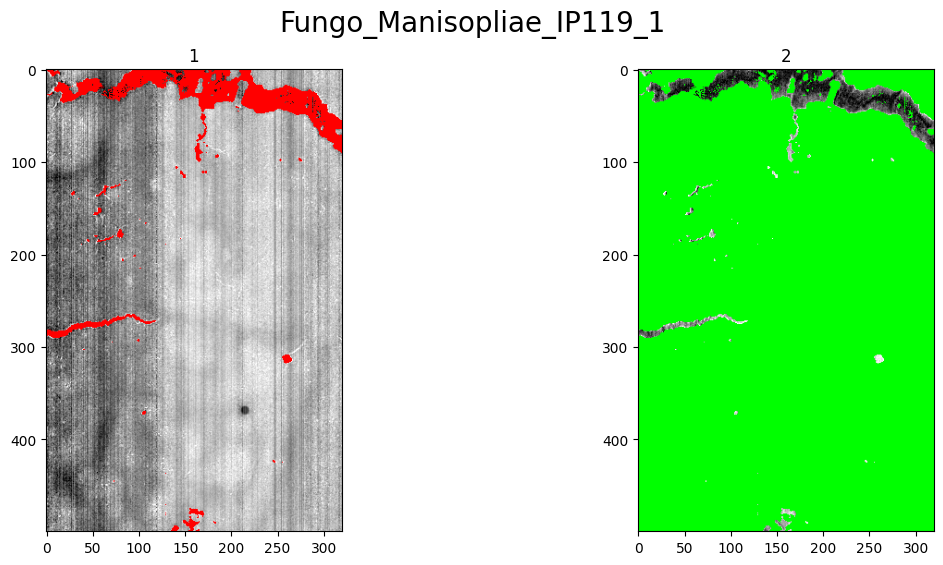

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



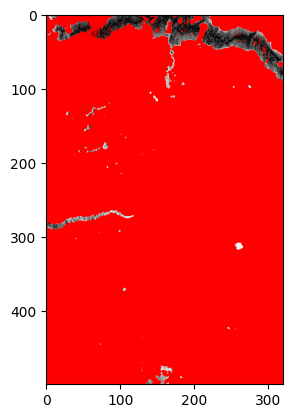

[     0      4      5 ... 159997 159998 159999] (8512,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

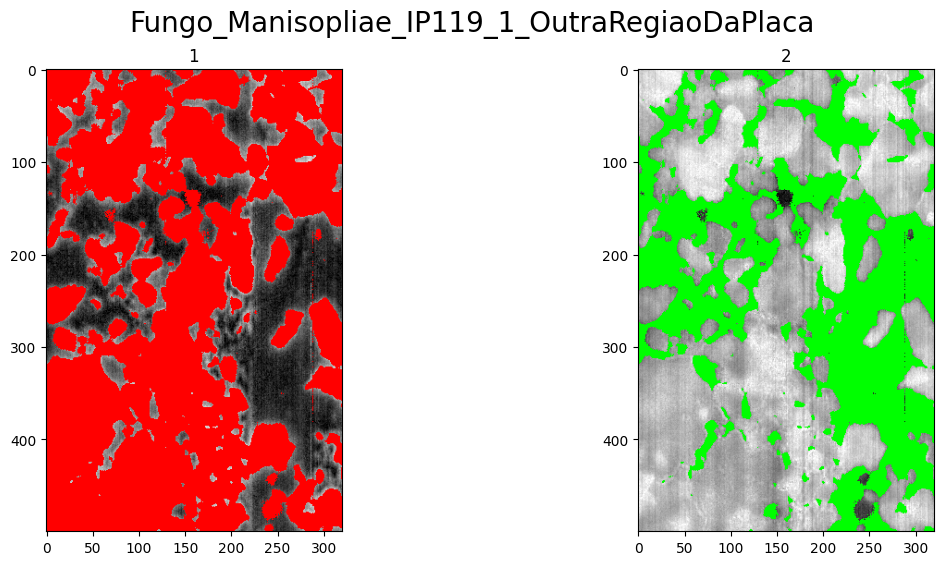

_____________________________________________________________________________________________________________________________ 



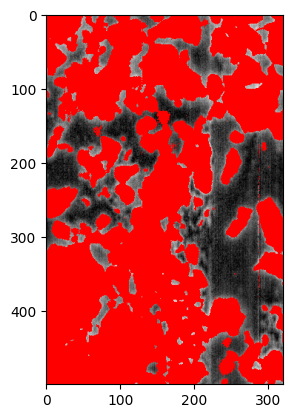

[     0      1      2 ... 159986 159987 159988] (57973,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

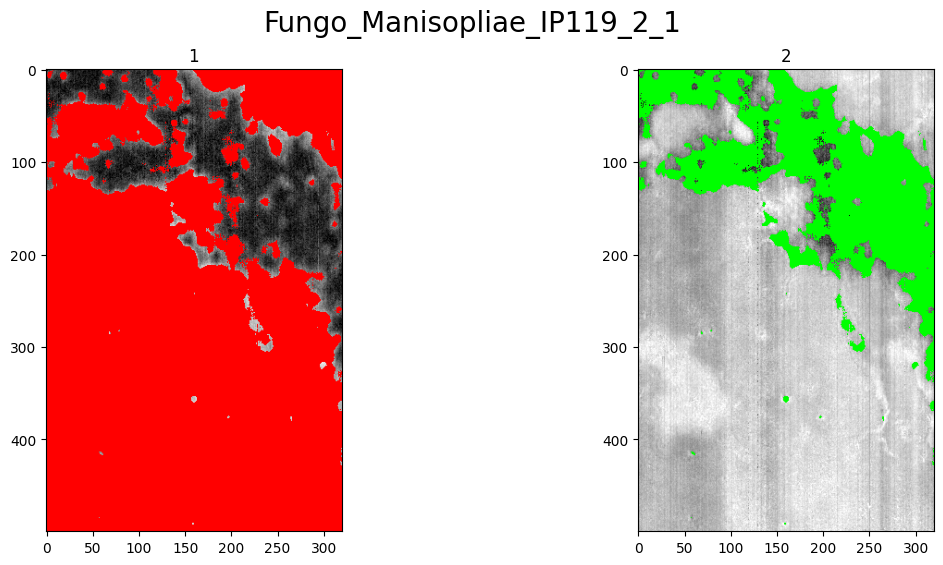

_____________________________________________________________________________________________________________________________ 



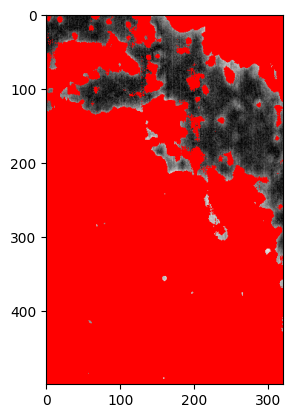

[     0      7      8 ... 159997 159998 159999] (35134,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

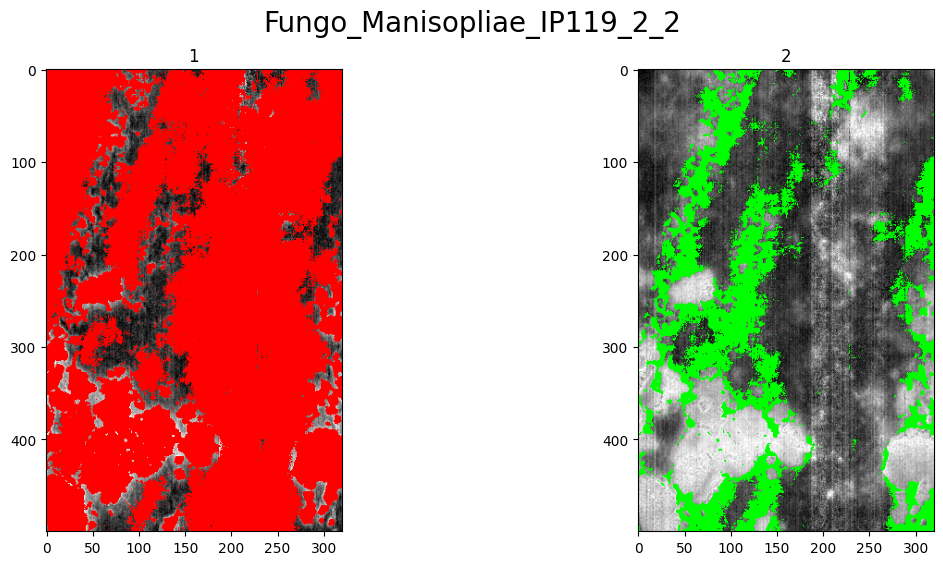

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



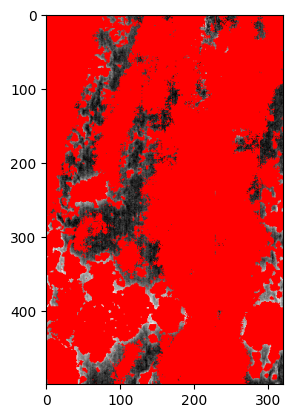

[     0      1      2 ... 159948 159949 159950] (34330,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

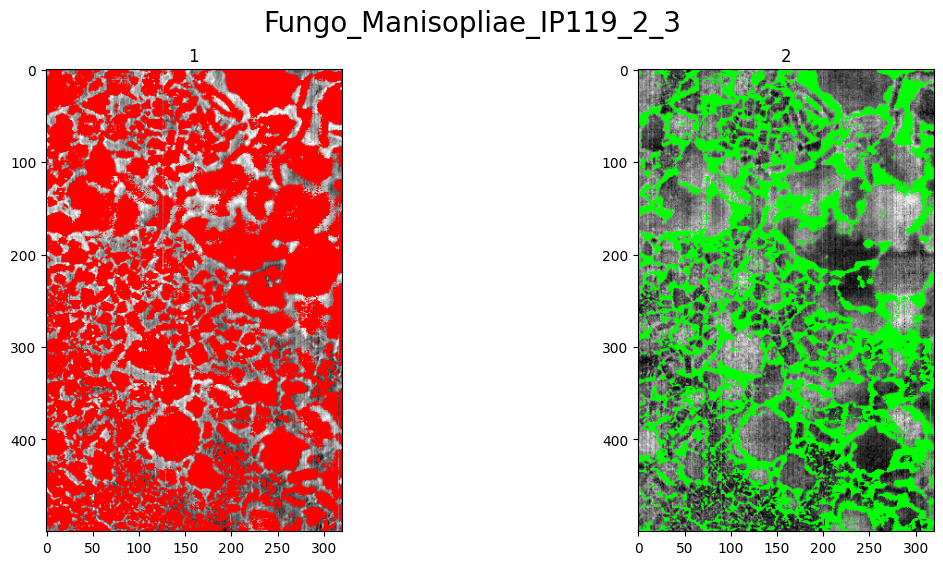

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



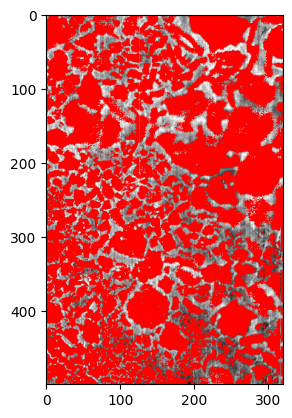

[     0      1      2 ... 159984 159985 159999] (55787,) (160000,)


In [7]:
fungus_list_inds, fungus_list_clusters = hsiImageProcess(fungus_data)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

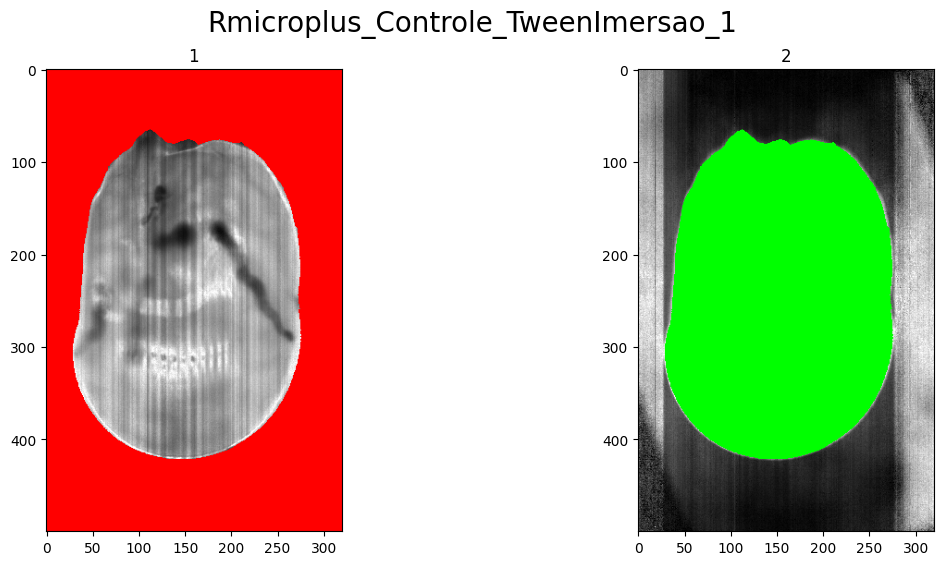

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



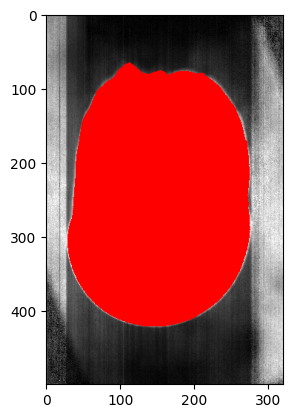

[     0  20912  21230 ... 134879 134880 134881] (88545,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

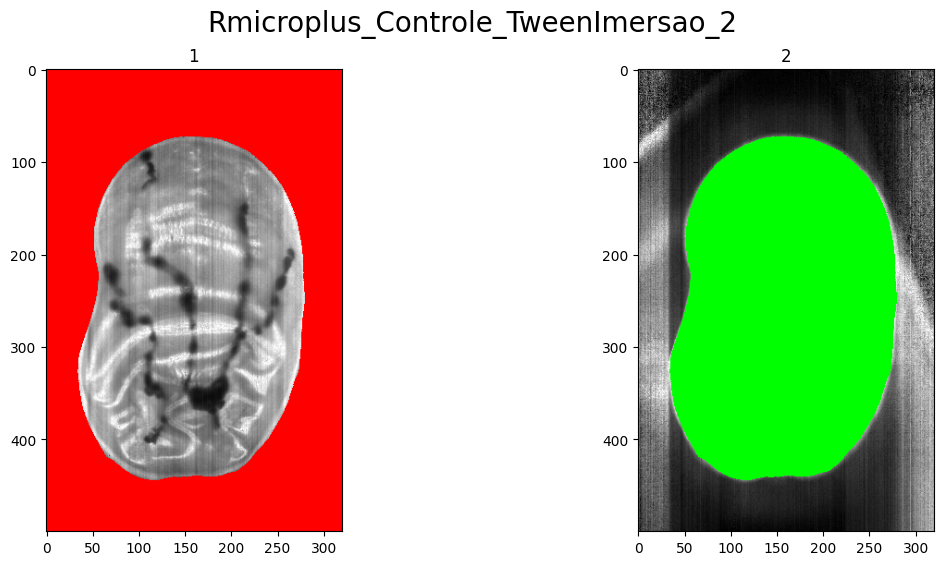

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



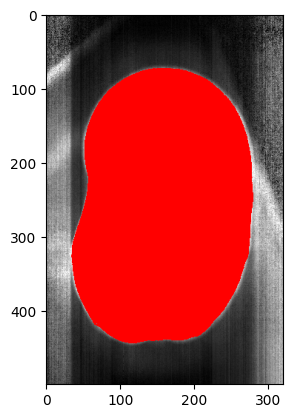

[     0  23504  23505 ... 142200 142201 142202] (85890,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

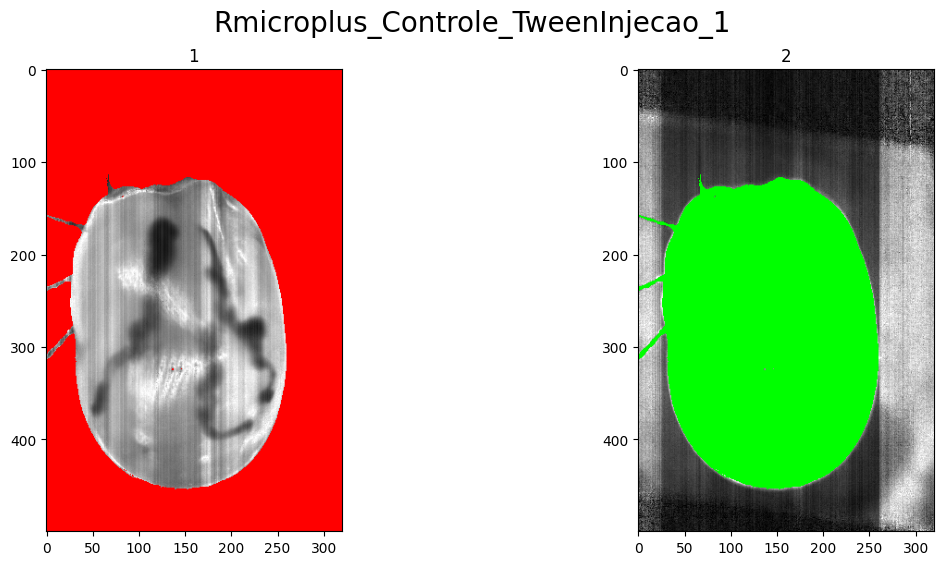

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



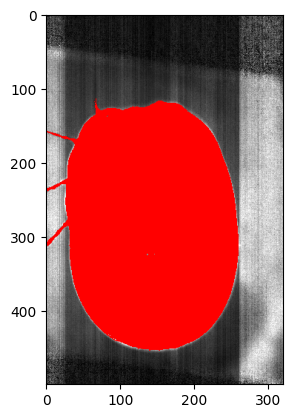

[     0  36547  36867 ... 145420 145432 145433] (95002,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

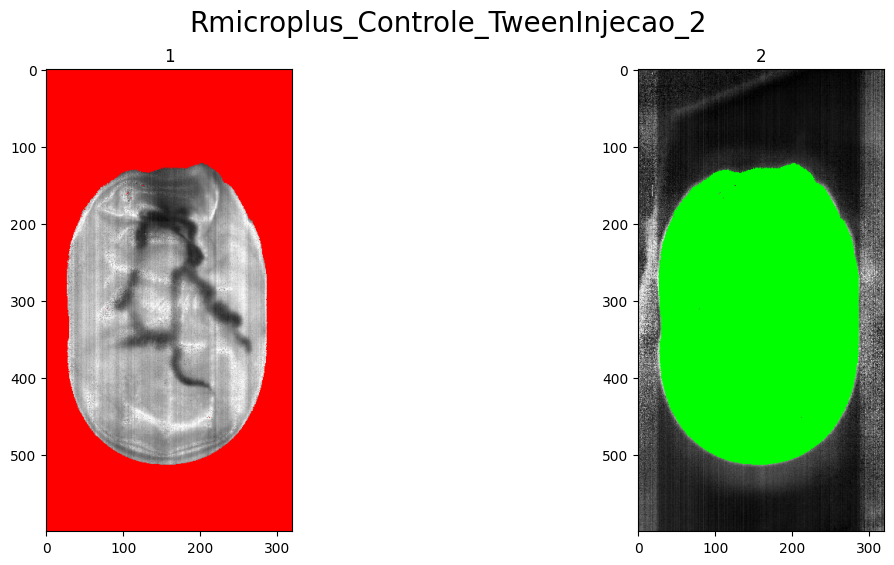

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



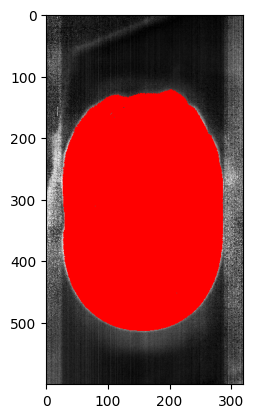

[     0  39240  39241 ... 164325 164326 164327] (106778,) (192000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

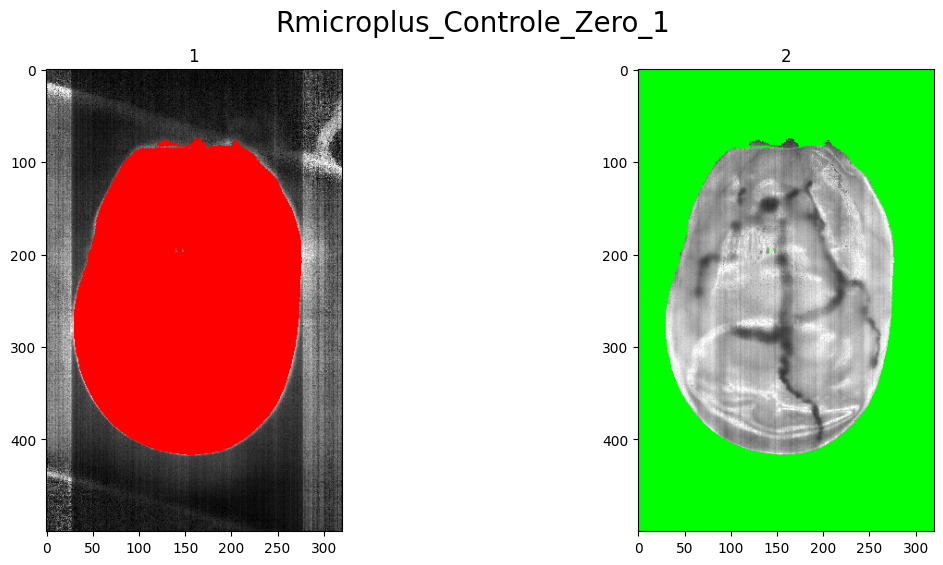

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



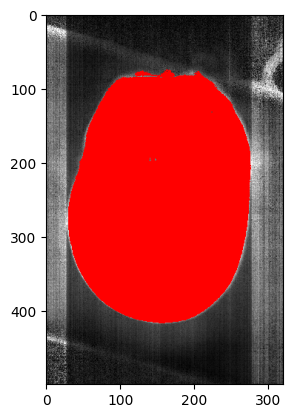

[     0  24162  24163 ... 133598 133599 133600] (92359,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

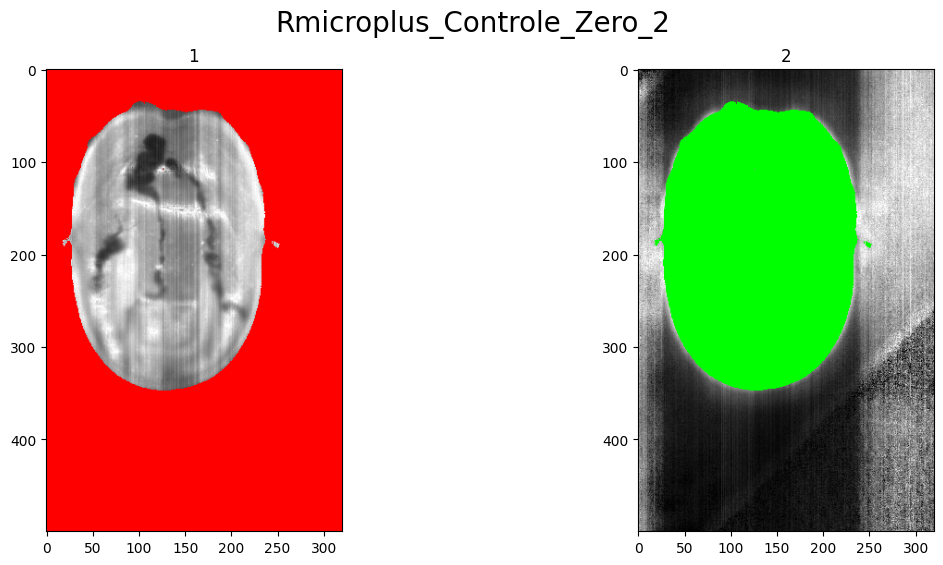

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



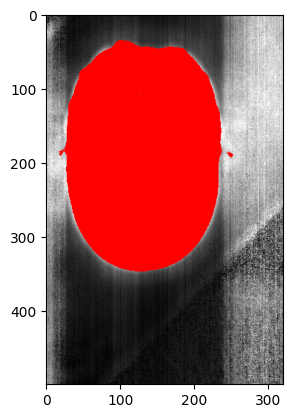

[     0  11299  11300 ... 111172 111173 111174] (106091,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

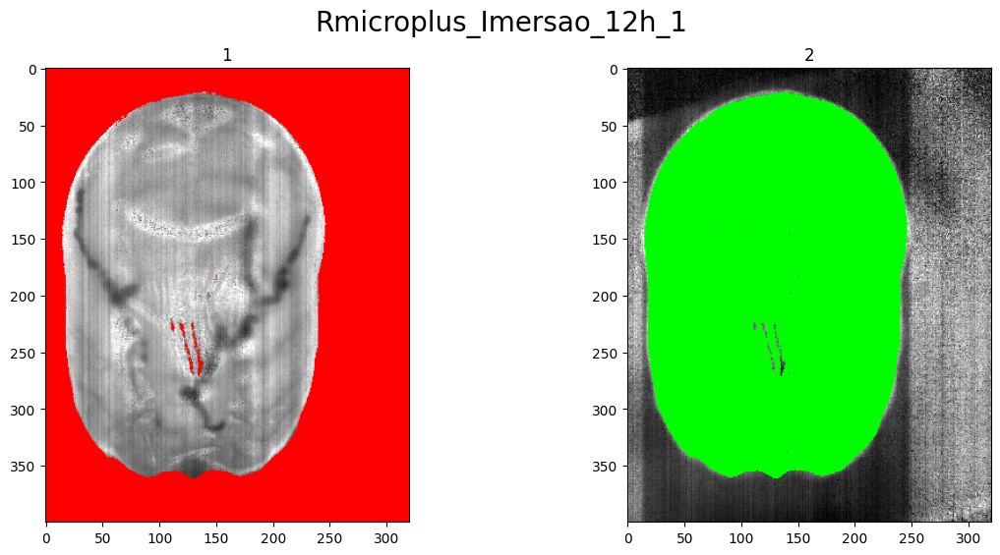

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



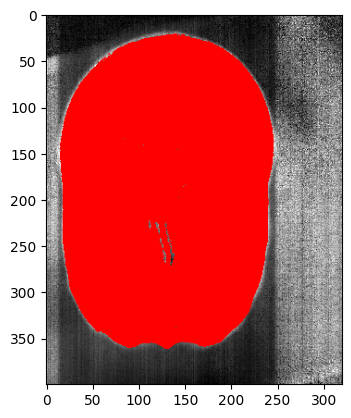

[     0   6858   6859 ... 115650 115651 115652] (62282,) (128000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

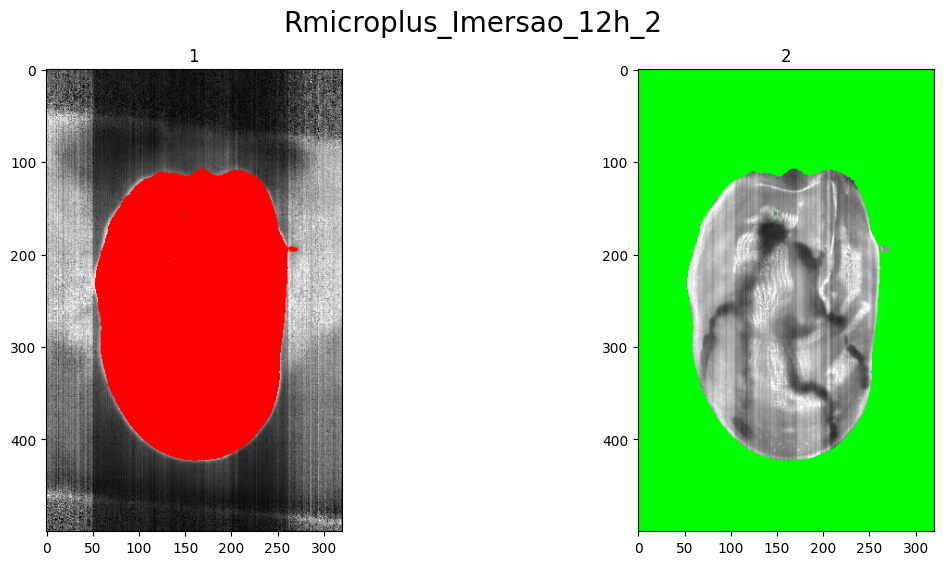

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



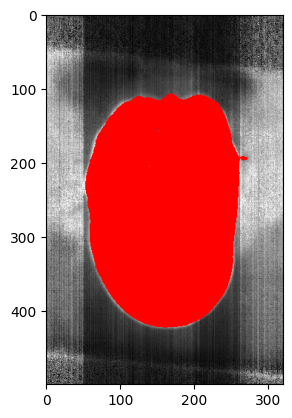

[     0  34408  34725 ... 135521 135522 135524] (105868,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

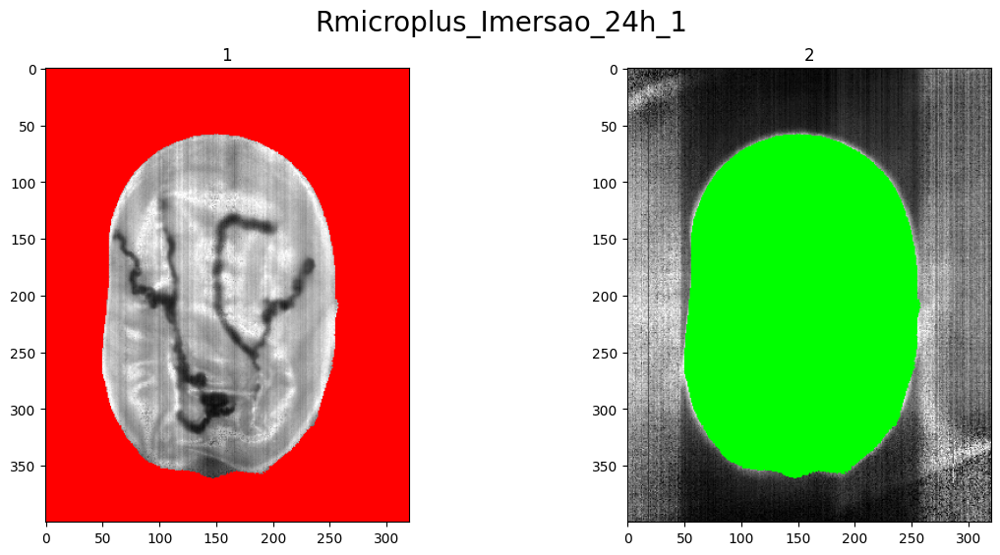

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



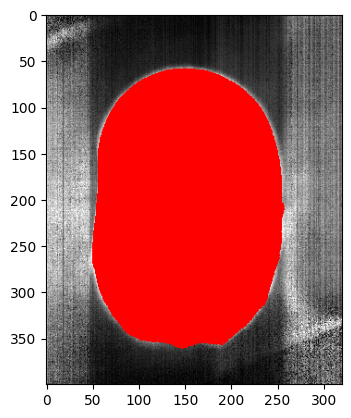

[     0  18709  18711 ... 115666 115667 115668] (76246,) (128000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

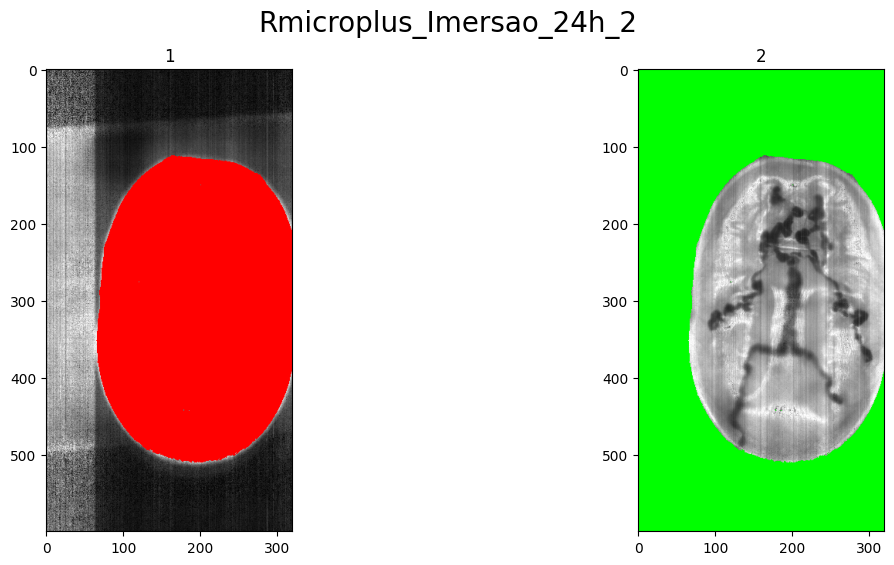

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



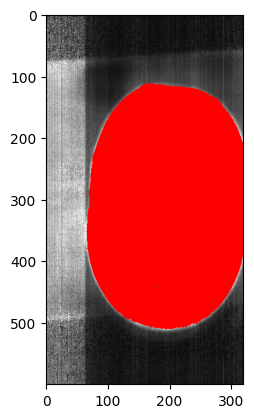

[     0  36002  36003 ... 163401 163402 163403] (107190,) (192000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

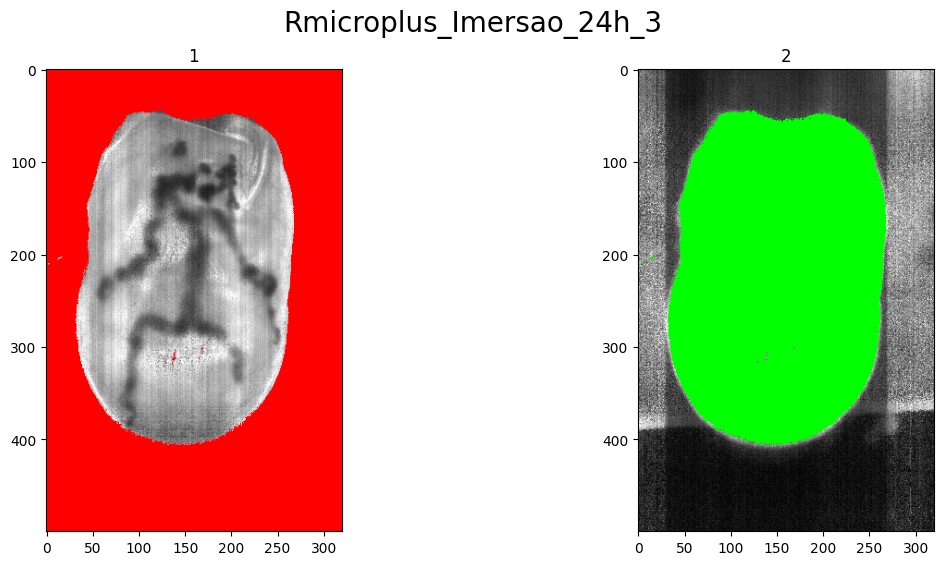

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



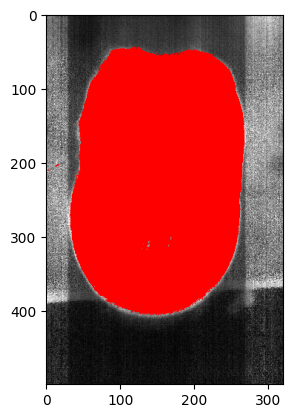

[     0  14199  14204 ... 130073 130074 130075] (89131,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

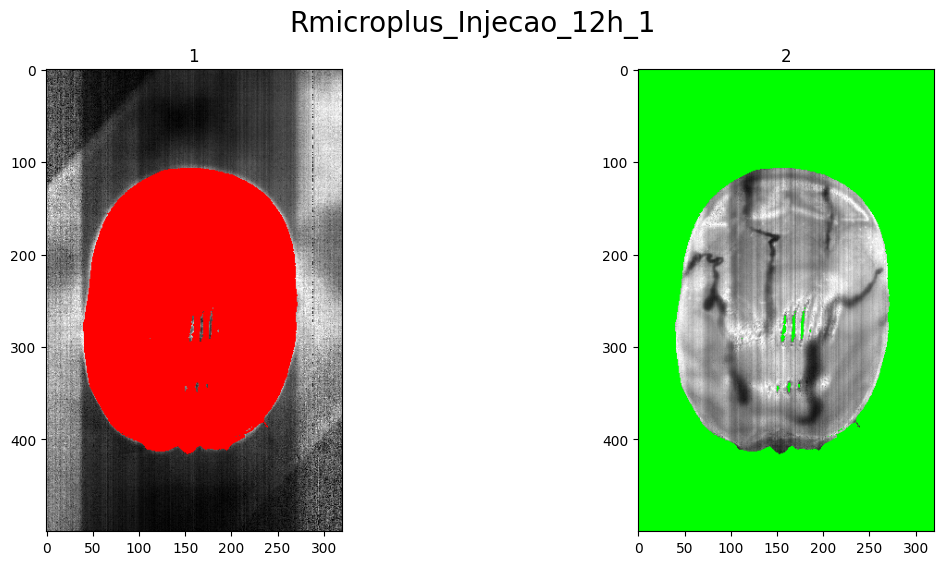

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



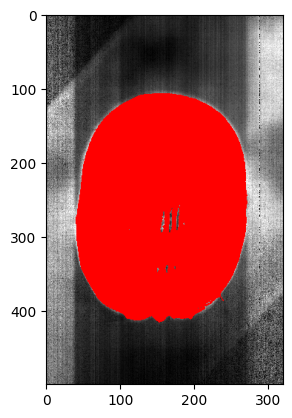

[     0  34383  34385 ... 132956 133272 133273] (101606,) (160000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

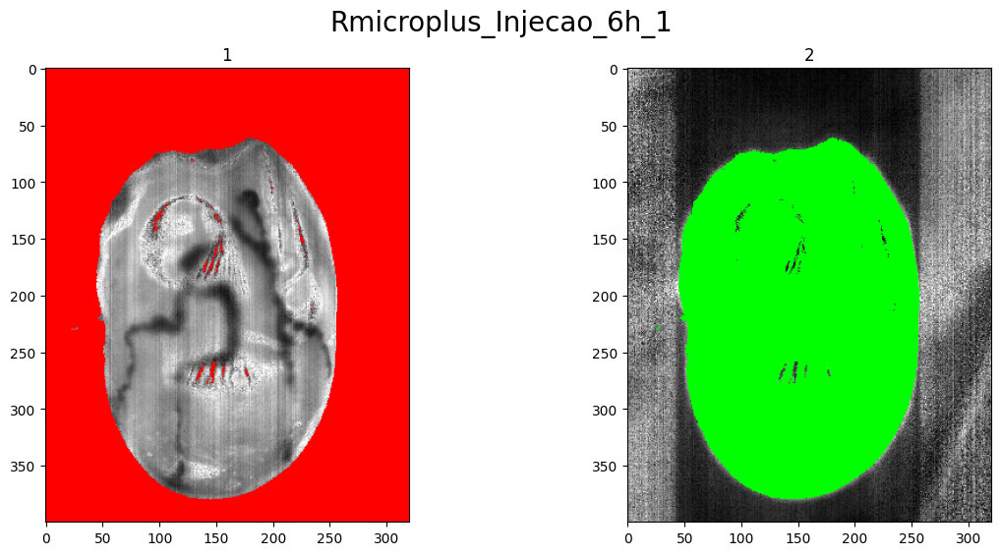

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



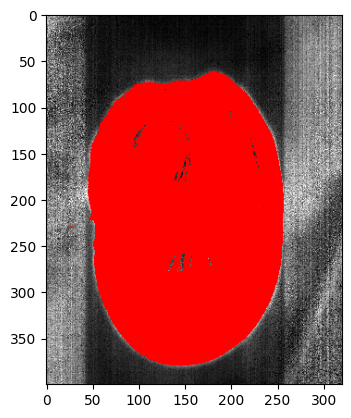

[     0  19700  20017 ... 121434 121435 121745] (73733,) (128000,)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 700x700 with 0 Axes>

<Figure size 900x900 with 0 Axes>

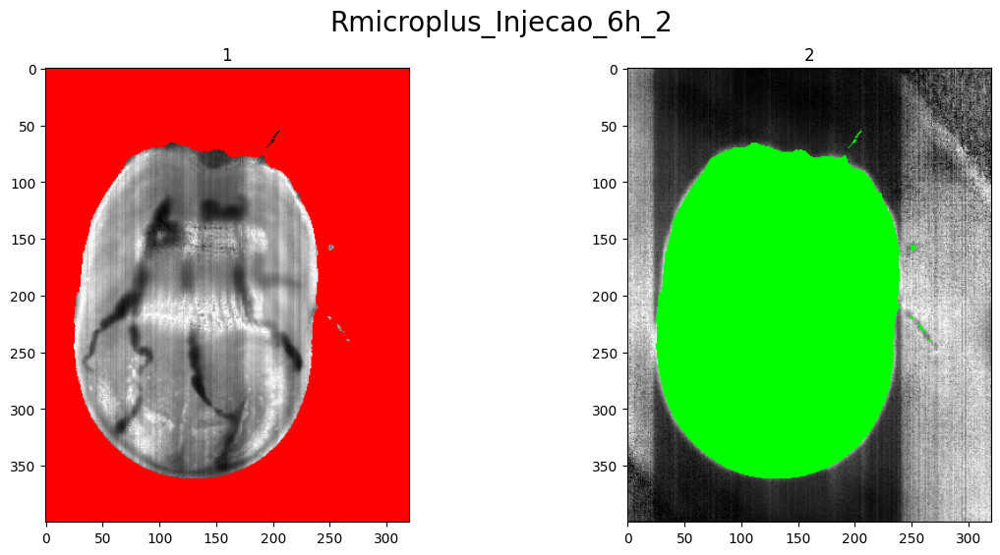

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


_____________________________________________________________________________________________________________________________ 



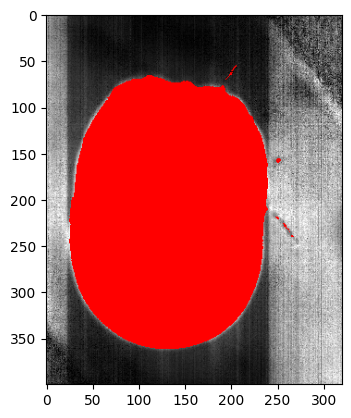

[     0  17805  18124 ... 115661 115662 115663] (75957,) (128000,)


In [8]:
samples_list_inds, samples_list_clusters = hsiImageProcess(samples_data)

In [ ]:
def visualizate_clusters(tittle, sample_cluster, image, cut=None):

#   image = moveAxis(image)
  image=image[210,:,:]
  out_i = getClusters(image, sample_cluster, 0, (1, 1, 1))
  plt.title(tittle)
  plt.imshow(rgbscale(out_i))
  plt.axis()
  plt.show()
  print('\n')
  
for key in fungus_data.keys():
  visualizate_clusters(key, fungus_list_clusters[key], 
                      fungus_data[key])

for key in samples_data.keys():
  visualizate_clusters(key, samples_list_clusters[key], 
                      samples_data[key])

In [68]:
def get_Xy(DATA, info, sample_cluster, spectral_range=(0, 230)):

    X_test = np.array([]).reshape(0, spectral_range[1] - spectral_range[0])
    X_train = np.array([]).reshape(0, spectral_range[1] - spectral_range[0])
    y_test = np.array([]).reshape(-1, 1)
    y_train = np.array([]).reshape(-1, 1)

    for key in DATA.keys():
        data = DATA[key]
        # data = moveAxis(data)
        matrix = hsi2matrix(data)
        matrix = matrix[:, spectral_range[0]:spectral_range[1]]

        ind, _ = sum_idx_array(realIdx(sample_cluster[key], 1))

        idx_train, idx_test = train_test_split(ind, test_size=info[key][1], shuffle=False)

        X_test = np.vstack([X_test, matrix[idx_test]])
        X_train = np.vstack([X_train, matrix[idx_train]])

        # print(key,'----->', data.shape, data[150,140,:])
        # print(X_train, X_test)
        # print(idx_train.shape, idx_test.shape)

        #Setando os targets
        y = np.ones(idx_train.shape) * info[key][0]
        y = y.reshape(-1, 1)
        y_train = np.vstack([y_train, y])

        y = np.ones(idx_test.shape) * info[key][0] 
        y = y.reshape(-1, 1)
        y_test = np.vstack([y_test, y])

        # print(X_train, y_train, '\n', X_train.shape, y_train.shape)

        # VISUALIZATION
        # size_train = len(sample_cluster[key]) * (1 - info[key][1])

        # X_train_separation = sample_cluster[key][:int(size_train)]
        # X_test_separation = sample_cluster[key][len(X_train_separation):]

        # X_test_separation_aux = np.ones(len(X_test_separation)) * 2
        # idx_test, rem = sum_idx_array(realIdx(X_test_separation, 1))
        # X_test_separation = rev_idx_array(idx_test, rem, tfill=X_test_separation_aux)

        # sample_cluster_visualizate = np.concatenate((X_train_separation, X_test_separation))
        # visualization_sample_separation(data[50,:,:], sample_cluster_visualizate, key)

    return X_train, X_test, y_train, y_test


def visualization_sample_separation(image, sample_cluster, key, X_train_size=None, X_test_size=None):
    image = getClusters(image, sample_cluster, 1, (1, 0, 0))
    image = getClusters(image, sample_cluster, 2, (0, 1, 0))

    red_patch = mpatches.Patch(color='red', label='Trian size')
    green_patch = mpatches.Patch(color='green', label='Test size')

    fig, ax = plt.subplots(figsize=(12,8))

    ax.axis()
    ax.imshow(rgbscale(image))
    fig.legend(title='Separation', handles=[red_patch, green_patch], loc='center right')
    plt.title('Sample: ' + key)
    plt.show()


def get_Xy_DataFrame(DATA, sample_cluster, target, exception=list, spectral_range=(0, 256)):
    df = pd.DataFrame()

    X_ = np.array([]).reshape(0, spectral_range[1] - spectral_range[0])
    y_ = np.array([]).reshape(-1, 1)

    for key in DATA.keys():
        
        temp=[key for name in exception if name in key]
        if len(temp)>0:
            # print(temp)
            continue
        
        data = DATA[key]
        
        matrix = hsi2matrix(data)
        matrix = matrix[:, spectral_range[0]:spectral_range[1]]

        ind, _ = sum_idx_array(realIdx(sample_cluster[key], 1))

        X_ = pd.DataFrame(matrix[ind])
        
        y = np.ones(ind.shape)*target
        y = y.reshape(-1, 1)
        y_ = np.vstack([y_, y])
        
        df = df.append(X_)

    df = df.assign(target = y_)
    df.columns = [f'band-{i}' for i in range(1,257)]+['target']

    return df

def plot_spectrum_analysis(dict_samples, ind_, df, name_file, tittle, tam0, exception=list):
    dict_plot={}
    for key in dict_samples:  
        temp=[key for name in exception if name in key]
        if len(temp)>0:
            # print(temp)
            continue
        
        tam=ind_[key].shape[0]
        tam=(tam+tam0)
        dict_plot[key]=df.iloc[tam0:tam,:]
        tam0=tam
              
    print(dict_plot.keys())
    # #all Spectral
    plt.figure(figsize=(16,8))
    for i, sample in enumerate(dict_plot.keys()):
        plt.plot(dict_plot[sample].mean(), label=sample)
    plt.title(f'Spectrum for {tittle} Crop capture',fontsize=19)
    plt.legend()
    plt.xticks(range(15, 256, 16), rotation=50)
    plt.savefig(folder+f'{name_file}.png')
    # plt.close(fig)
    plt.show()
  
    return tam0

def plot_mean(dict_samples, ind_samples_,
              dict_fungus, ind_fungus_, df_,
              name_file, tittle, tam0, exception=list):
        
    dict_plot_fungus=pd.DataFrame()
    for key in dict_fungus:  
        temp=[key for name in exception if name in key]
        if len(temp)>0:
            # print(temp)
            continue
        
        tam=ind_fungus_[key].shape[0]
        tam=(tam+tam0)
        dict_plot_fungus=dict_plot_fungus.append(df_.iloc[tam0:tam,:], ignore_index=True)
        tam0=tam

    dict_plot_samples=pd.DataFrame()
    for key in dict_samples:  
        temp=[key for name in exception if name in key]
        if len(temp)>0:
            # print(temp)
            continue
        
        tam=ind_samples_[key].shape[0]
        tam=(tam+tam0)
        dict_plot_samples=dict_plot_samples.append(df_.iloc[tam0:tam,:], ignore_index=True)
        tam0=tam

    plt.figure(figsize=(16,8))
    plt.plot(dict_plot_fungus.mean(), label="Fungus")
    plt.plot(dict_plot_samples.mean(), label="RMicroplus")
    plt.xticks(range(0, 256, 9), rotation=50)
    plt.legend(fontsize=17)
    plt.savefig("output.png", dpi=300) 
  
    return tam0

In [69]:
# teste2 = np.arange(48).reshape(-1, 4, 4) 
# kmeans_result = np.array([0, 0, 1, 1, 1, 1, 0,0, 1, 1, 1, 1])

# print(teste2)

# X_train0, X_test0, y_train1, y_test1 = get_Xy(teste2, 0.5, kmeans_result, 1)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:94: FutureWarning: The frame.append method 

dict_keys(['Fungo_Manisopliae_IP119_1', 'Fungo_Manisopliae_IP119_1_OutraRegiaoDaPlaca', 'Fungo_Manisopliae_IP119_2_1', 'Fungo_Manisopliae_IP119_2_2', 'Fungo_Manisopliae_IP119_2_3'])


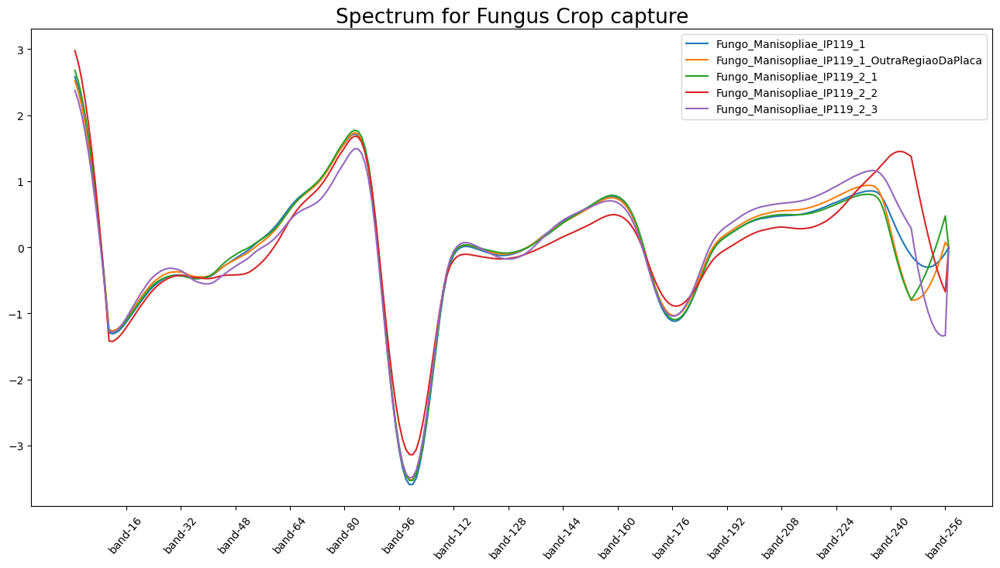

dict_keys(['Rmicroplus_Controle_TweenImersao_1', 'Rmicroplus_Controle_TweenImersao_2', 'Rmicroplus_Controle_TweenInjecao_1', 'Rmicroplus_Controle_TweenInjecao_2', 'Rmicroplus_Controle_Zero_2'])


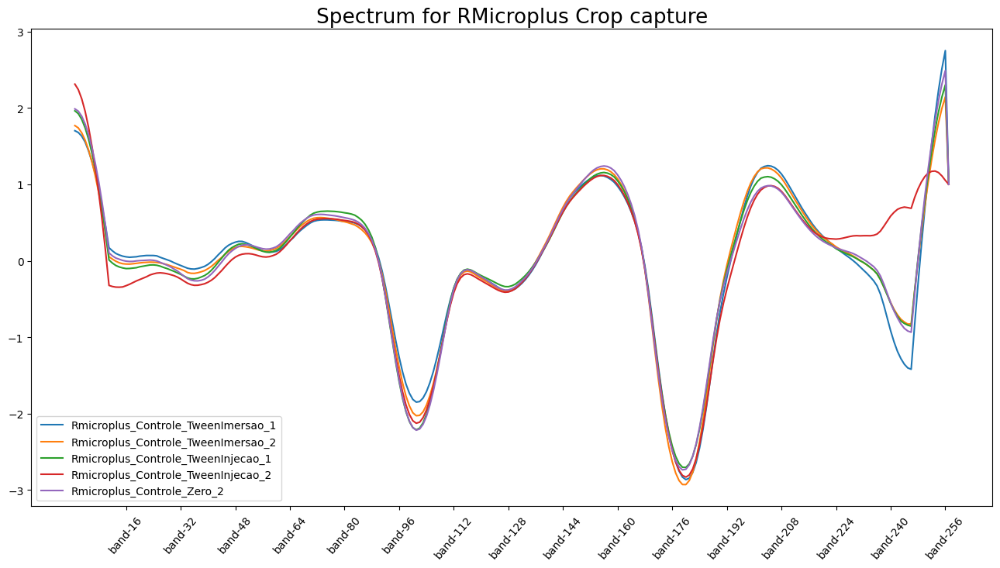

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:141: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dict_plot_fungus=dict_plot_fungus.append(df_.iloc[tam0:tam,:], ignore_index=True)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:153: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dict_plot_samples=dict_plot_samples.append(df_.iloc[tam0:tam,:], ignore_index=True)


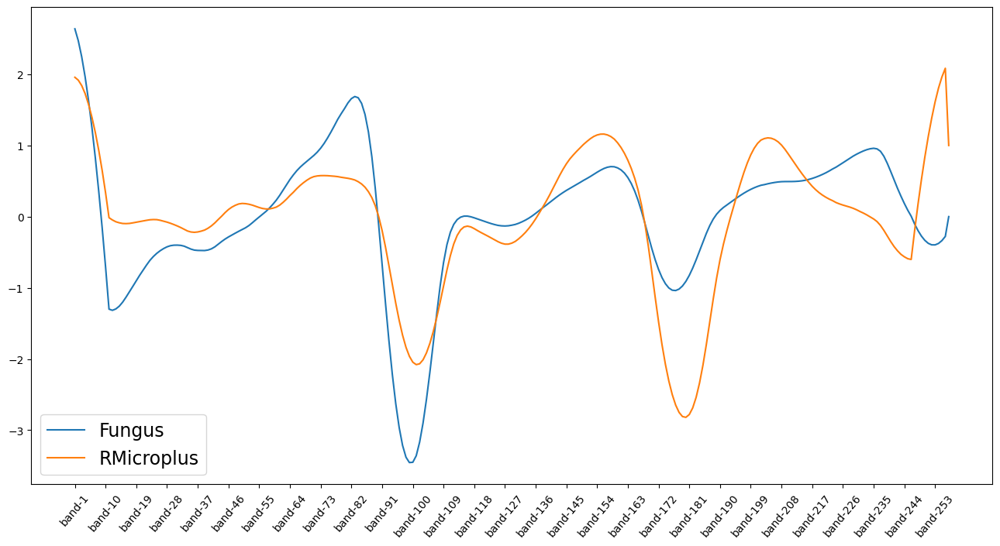

In [72]:
# Targets: 0 -> Fungus
#          1 -> R. Microplus controle

train_exception=['Meio', 'Rmicroplus_Controle_Zero_1', '_Injecao', '_Imersao']
df_train=pd.DataFrame()

df_train= get_Xy_DataFrame(fungus_data, fungus_list_clusters, target=0, exception=list(train_exception))
df_train=df_train.append(get_Xy_DataFrame(samples_data, samples_list_clusters, target=1, exception=list(train_exception)), 
                         ignore_index=True)

final=plot_spectrum_analysis(fungus_data, fungus_list_inds, df_train ,
                             'Train-FungusCrop_all_spectrum_1', 'Fungus',
                             tam0=0, exception=list(train_exception))

plot_spectrum_analysis(samples_data, samples_list_inds, df_train,
                       'Train-RMicroplus_Crop_all_spectrum_1', 'RMicroplus', 
                       tam0=final, exception=list(train_exception))

plot_mean(samples_data, samples_list_inds,
          fungus_data, fungus_list_inds, df_train,
          'Train-RMicroplus_Crop_all_spectrum_1', 'RMicroplus', 
          tam0=0, exception=list(train_exception))

# Scrambling training data
df_train = shuffle(df_train)


In [385]:
len(df_train.loc[df_train['target']==0.0]), len(df_train.loc[df_train['target']==1.0])

(608545, 349694)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\4281788546.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_5216\917672181.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val=df_val.append(get_Xy_DataFrame(samples_data, samples_list_clusters, target=1, exception=val_exeption), ignore_index=True)


dict_keys(['Rmicroplus_Controle_Zero_1'])


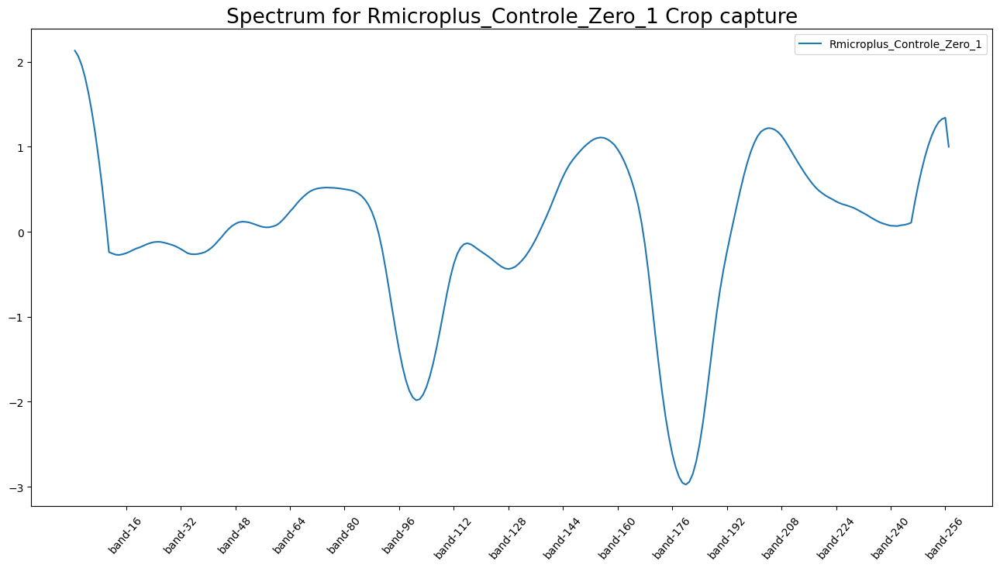

In [109]:
# Targets: 0 -> Fungus
#          1 -> R. Microplus controle

val_exeption=list(samples_data.keys())
val_exeption.remove('Rmicroplus_Controle_Zero_1')

df_val=pd.DataFrame()

# df_val= get_Xy_DataFrame(fungus_data, fungus_list_clusters, target=0)
df_val=df_val.append(get_Xy_DataFrame(samples_data, samples_list_clusters, target=1, exception=val_exeption), ignore_index=True)

plot_spectrum_analysis(samples_data, samples_list_inds, df_val ,
                       'Validation-Rmicroplus_Controle_Zero_1', 'Rmicroplus_Controle_Zero_1', tam0=0, exception=list(val_exeption))

# Scrambling valing data
df_val = shuffle(df_val)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_9840\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_9840\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_9840\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_9840\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_9840\1590905188.py:94: FutureWarning: The frame.append method 

dict_keys(['Rmicroplus_Imersao_12h_1', 'Rmicroplus_Imersao_12h_2', 'Rmicroplus_Imersao_24h_1', 'Rmicroplus_Imersao_24h_2', 'Rmicroplus_Imersao_24h_3', 'Rmicroplus_Injecao_12h_1', 'Rmicroplus_Injecao_6h_1', 'Rmicroplus_Injecao_6h_2'])


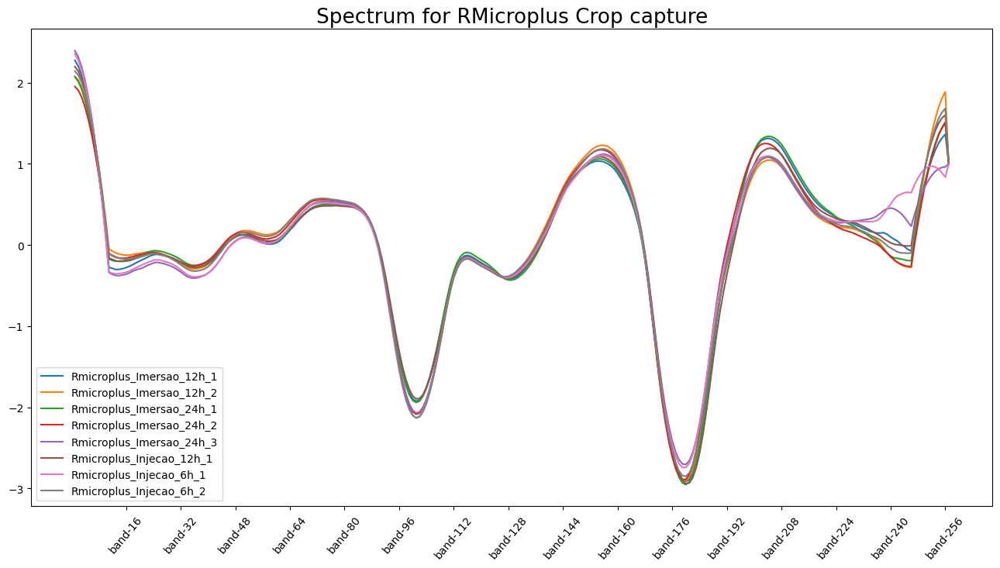

In [44]:
# Targets: 0 -> Fungus
#          1 -> R. Microplus controle

test_exeption=['_Controle', 'Fungo', 'teste']
df_test=pd.DataFrame()

df_test=df_test.append(get_Xy_DataFrame(samples_data, samples_list_clusters, target=1, exception=list(test_exeption)), ignore_index=True)

plot_spectrum_analysis(samples_data, samples_list_inds, df_test ,
                       'test-RMicroplus_Crop_all_spectrum_1', 'RMicroplus', tam0=0, exception=list(test_exeption))

# Scrambling testing data
df_test = shuffle(df_test)


C:\Users\Usuario\AppData\Local\Temp\ipykernel_14024\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_14024\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_14024\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_14024\1590905188.py:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(X_)


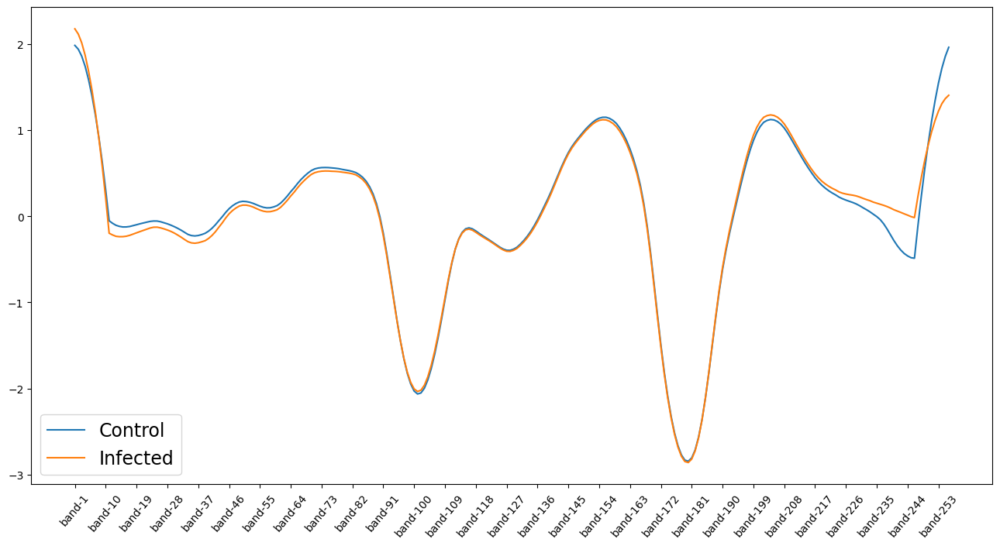

In [266]:
train_exception=['Meio', '_Injecao', '_Imersao']
df_train_control=get_Xy_DataFrame(samples_data, samples_list_clusters, target=1, exception=list(train_exception))
# plot_spectrum_analysis(samples_data, samples_list_inds, df_train_control ,
#                        'Train-RMicroplus_Crop_all_spectrum_1', 'RMicroplus', tam0=0, exception=list(train_exception))

df_plot=df_train_control.drop(columns=['target'])
df_plot=df_plot.sum()/len(df_train_control)

df_plot_test=df_test.drop(columns=['target'])
df_plot_test=df_plot_test.sum()/len(df_test)

plt.figure(figsize=(16,8))
plt.plot(df_plot, label="Control")
plt.plot(df_plot_test, label="Infected")
plt.xticks(range(0, len(df_plot), 9), rotation=50)
plt.legend(fontsize=17)
plt.savefig("output.png", dpi=300) 

In [12]:
print(df_train.shape)

(958321, 257)


In [15]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

                      df_train:  1.8 GiB
                        df_val: 133.1 MiB
                           _i2: 16.5 KiB
                           _i4:  5.7 KiB
                          _i11:  4.2 KiB
                        KMeans:  1.6 KiB
                           PCA:  1.6 KiB
                  MinMaxScaler:  1.6 KiB
                StandardScaler:  1.6 KiB
                           SVC:  1.6 KiB


#Classification

##Classifier Grid Search

In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder
 
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.gaussian_process import GaussianProcessClassifier

dict_classifiers = {
    # "Logistic Regression": LogisticRegression(),
    #"Nearest Neighbors": KNeighborsClassifier(),
    "LinearSVM": SVC(verbose=2),
    # "Gradient Boosting Classifier": GradientBoostingClassifier(n_estimators=100, verbose=2),
    # "Decision Tree": tree.DecisionTreeClassifier(),
    "RandomForest": RandomForestClassifier(n_estimators=50, verbose=2),
    "NeuralNet": MLPClassifier(hidden_layer_sizes=(256,128,64,32),activation="relu",random_state=1, alpha = 1,  verbose=2),
    # "Neural 512": MLPClassifier(activation= 'tanh', alpha= 0.005, hidden_layer_sizes= (256, 115), learning_rate= 'adaptive', solver= 'adam'),
    #"Naive Bayes": GaussianNB(),
    #"AdaBoost": AdaBoostClassifier(),
    #"QDA": QuadraticDiscriminantAnalysis(),     ## Atualiza uma regressão logística para lidar com problemas não lineares
    # "Gaussian Process": GaussianProcessClassifier()
}

In [17]:
def batch_classify(X_train, y_train, X_test, y_test, no_classifiers, verbose = True):
    """
    This method, takes as input the X, Y matrices of the Train and Test set.
    And fits them on all of the Classifiers specified in the dict_classifier.
    The trained models, and accuracies are saved in a dictionary. The reason to use a dictionary
    is because it is very easy to save the whole dictionary with the pickle module.
    
    Usually, the SVM, Random Forest and Gradient Boosting Classifier take quiet some time to train. 
    So it is best to train them on a smaller dataset first and 
    decide whether you want to comment them out or not based on the test accuracy score.
    """
    
    dict_models = {}
    for classifier_name, classifier in list(dict_classifiers.items())[:no_classifiers]:
        # t_start = time.clock()
        print(classifier_name)
        history=classifier.fit(X_train, y_train)
        # t_end = time.clock()
        
        # t_diff = t_end - t_start
        train_score = classifier.score(X_train, y_train)
        test_score = classifier.score(X_test, y_test)
        
        dict_models[classifier_name] = {'model': classifier, 'train_score': train_score, 'test_score': test_score}
        if verbose:
            print("trained {c}".format(c=classifier_name))
    return dict_models


def display_dict_models(dict_models, sort_by='test_score'):
    cls = [key for key in dict_models.keys()]
    test_s = [dict_models[key]['test_score'] for key in cls]
    training_s = [dict_models[key]['train_score'] for key in cls]
    
    df_ = pd.DataFrame(data=np.zeros(shape=(len(cls),3)), columns = ['classifier', 'train_score', 'test_score'])
    for ii in range(0,len(cls)):
        df_.loc[ii, 'classifier'] = cls[ii]
        df_.loc[ii, 'train_score'] = training_s[ii]
        df_.loc[ii, 'test_score'] = test_s[ii]
    
    display(df_.sort_values(by=sort_by, ascending=False))

In [77]:
dict_models={}

for i, path in enumerate(glob.glob(folder+'load_models/*')):
    print(path)
    name_model=path.split('\\')[1].split('.')[0].split('_')[0]
    dict_models[name_model]={'model': load(path)}

C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/load_models\LinearSVM_model.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/load_models\Neural512_model.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/load_models\NeuralNet_model.pkl
C:/Users/Usuario/Documents/UFG_Remoto/Projects/_HSI/IPTSP_carrapatos/load_models\RandomForest_model.pkl


In [106]:
dict_models.keys()

dict_keys(['LinearSVM', 'Neural512', 'NeuralNet', 'RandomForest'])

In [ ]:
predict=dict_models['NeuralNet']['model'].predict(test.iloc[:,:256])

In [ ]:
import time

# inicio = time.time()
train, test = train_test_split(df_train, test_size=0.2)

dict_models = batch_classify(train.iloc[:,:256], train.iloc[:,256], test.iloc[:,:256],
                             test.iloc[:,256], no_classifiers = 3, verbose = True)
display_dict_models(dict_models)

for i, model in enumerate(dict_models.keys()):
    with open(folder+f'load_models/{model}_model.pkl', 'wb') as f:
        pickle.dump(dict_models[str(model)]['model'], f)

# fim = time.time()
# print(fim - inicio)

#Results Visualization

In [110]:
y_hat_test=dict_models['LinearSVM']['model'].predict(df_val.iloc[:,:256])

print(classification_report(np.array(df_val.iloc[:,256]), y_hat_test))

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00     67641

    accuracy                           1.00     67641
   macro avg       1.00      1.00      1.00     67641
weighted avg       1.00      1.00      1.00     67641



In [66]:
df_fungus=df_train.loc[df_train['target']==0.0]

y_hat_test=dict_models['LinearSVM']['model'].predict(pd.concat([df_test.iloc[:,:256], df_fungus.iloc[:7000,:256]]))

print(classification_report(np.array(pd.concat([df_test.iloc[:,256], df_fungus.iloc[:7000,256]])), y_hat_test, target_names=['Fungus', 'Carrapato']))

              precision    recall  f1-score   support

      Fungus       1.00      1.00      1.00      7000
   Carrapato       1.00      1.00      1.00    491987

    accuracy                           1.00    498987
   macro avg       1.00      1.00      1.00    498987
weighted avg       1.00      1.00      1.00    498987



In [67]:
df_fungus=df_train.loc[df_train['target']==0.0]

y_hat_test=dict_models['Random Forest']['model'].predict(pd.concat([df_test.iloc[:,:256], df_fungus.iloc[:7000,:256]]))

print(classification_report(np.array(pd.concat([df_test.iloc[:,256], df_fungus.iloc[:7000,256]])), y_hat_test, target_names=['Fungus', 'Carrapato']))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.7s finished


              precision    recall  f1-score   support

      Fungus       1.00      1.00      1.00      7000
   Carrapato       1.00      1.00      1.00    491987

    accuracy                           1.00    498987
   macro avg       1.00      1.00      1.00    498987
weighted avg       1.00      1.00      1.00    498987



In [68]:
df_fungus=df_train.loc[df_train['target']==0.0]

y_hat_test=dict_models['Neural Net']['model'].predict(pd.concat([df_test.iloc[:,:256], df_fungus.iloc[:7000,:256]]))

print(classification_report(np.array(pd.concat([df_test.iloc[:,256], df_fungus.iloc[:7000,256]])), y_hat_test, target_names=['Fungus', 'Carrapato']))

              precision    recall  f1-score   support

      Fungus       0.98      1.00      0.99      7000
   Carrapato       1.00      1.00      1.00    491987

    accuracy                           1.00    498987
   macro avg       0.99      1.00      0.99    498987
weighted avg       1.00      1.00      1.00    498987



In [74]:
os.makedirs(os.path.join(folder+'load_models'), exist_ok=True)

c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Controle_Zero_1 
Only one target value: True
[2 0 0 ... 0 0 0] (67641,) (67641,) (160000,) (160000, 256)


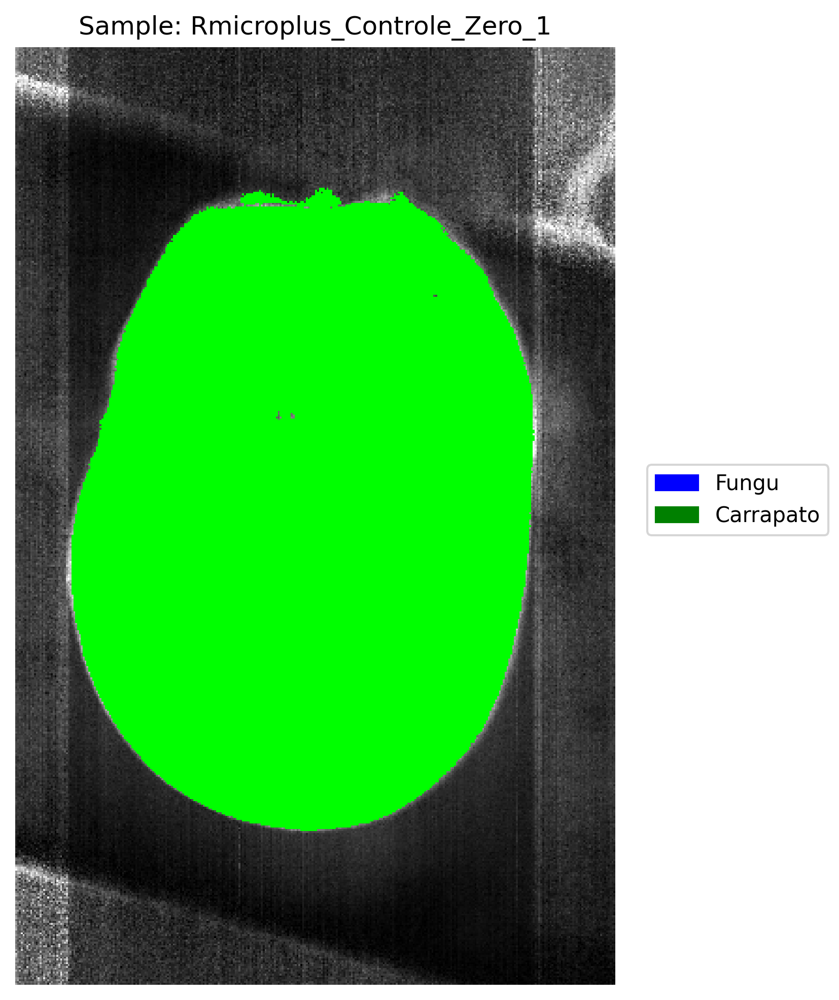

In [102]:
# 1 -> Fungus
# 2 -> Carrapato R. Microplus
colors = {
            '1': '#0000FF',#azul
            '2': '#00FF00',#verde
        }

#aqui plota somente resultados do tamanho do X_test da amostra
def result_visualization(DATA, key, sample_cluster, classifier, spectral_range=(0, 256)):
    
    title = key
    data = DATA[key]

    matrix = hsi2matrix(data)
    matrix = matrix[:, spectral_range[0]:spectral_range[1]]

    ind, _ = sum_idx_array(realIdx(sample_cluster[key], 1))
    # idx_train, idx_test = train_test_split(ind, test_size=info[key][1], shuffle=False)

    X_test = matrix[ind]

    ind, rem = sum_idx_array(realIdx(sample_cluster[key], 1))

    #model classification
    result = classifier.predict(X_test)
    print(key, '\nOnly one target value:', len(set(result)) == 1.0)
    result=result+1
    
    full_array = rev_idx_array(ind, rem, tfill=result)
    print(full_array, ind.shape, result.shape, full_array.shape, matrix.shape)

    imageResult = data[210,:,:]

    targets=[1,2]
    for key in targets:
      imageResult = getClusters(imageResult,full_array, key, hex2rgb(colors[str(int(key))]))

    #plotando a imagem
    blue_patch = mpatches.Patch(color='blue', label='Fungu')
    green_patch = mpatches.Patch(color='green', label='Carrapato')

    fig, ax = plt.subplots(**{'figsize': (7, 8), 'dpi': 300})

    ax.axis('off')
    plt.title('Sample: '+ title)
    ax.imshow(imageResult)

    fig.legend(handles=[blue_patch, green_patch], loc=7) 

aux = result_visualization(samples_data, 'Rmicroplus_Controle_Zero_1', samples_list_clusters,  dict_models['LinearSVM']['model'])
# aux2 = result_visualization_teste(data_casca_maca, sample_cluster_mc, X_test_mc, '')

In [103]:
# 1 -> Fungus
# 2 -> Carrapato R. Microplus
colors = {
            '1': '#0000FF',#azul
            '2': '#00FF00',#verde
        }

#aqui plota somente resultados do tamanho do X_test da amostra
def result_visualization(DATA, sample_cluster, classifier, spectral_range=(0, 256)):
  
  for key in DATA.keys():
    if 'Controle' in key:
      continue
    
    title = key
    data = DATA[key]

    matrix = hsi2matrix(data)
    matrix = matrix[:, spectral_range[0]:spectral_range[1]]

    ind, _ = sum_idx_array(realIdx(sample_cluster[key], 1))
    # idx_train, idx_test = train_test_split(ind, test_size=info[key][1], shuffle=False)

    X_test = matrix[ind]

    ind, rem = sum_idx_array(realIdx(sample_cluster[key], 1))

    #model classification
    result = classifier.predict(X_test)
    print(key, '\nOnly one target value:', len(set(result)) == 1.0)
    result=result+1
    
    full_array = rev_idx_array(ind, rem, tfill=result)
    imageResult = data[210,:,:]

    targets=[1,2]
    for target in targets:
      imageResult = getClusters(imageResult,full_array, target, hex2rgb(colors[str(int(target))]))

    #plotando a imagem
    blue_patch = mpatches.Patch(color='blue', label='Fungu')
    green_patch = mpatches.Patch(color='green', label='R. Microplus')

    fig, ax = plt.subplots(**{'figsize': (7, 8), 'dpi': 300})

    ax.axis('off')
    plt.title('Sample: '+ title)
    ax.imshow(imageResult)

    fig.legend(handles=[blue_patch, green_patch], loc=7) 

  return imageResult

In [104]:
dict_models.keys()

dict_keys(['LinearSVM', 'Neural512', 'NeuralNet', 'RandomForest'])

c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Imersao_12h_1 
Only one target value: False


c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Imersao_12h_2 
Only one target value: True


c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Imersao_24h_1 
Only one target value: False


c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Imersao_24h_2 
Only one target value: False


c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Imersao_24h_3 
Only one target value: False


c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Injecao_12h_1 
Only one target value: False


c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Injecao_6h_1 
Only one target value: False


c:\Users\Usuario\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Rmicroplus_Injecao_6h_2 
Only one target value: False


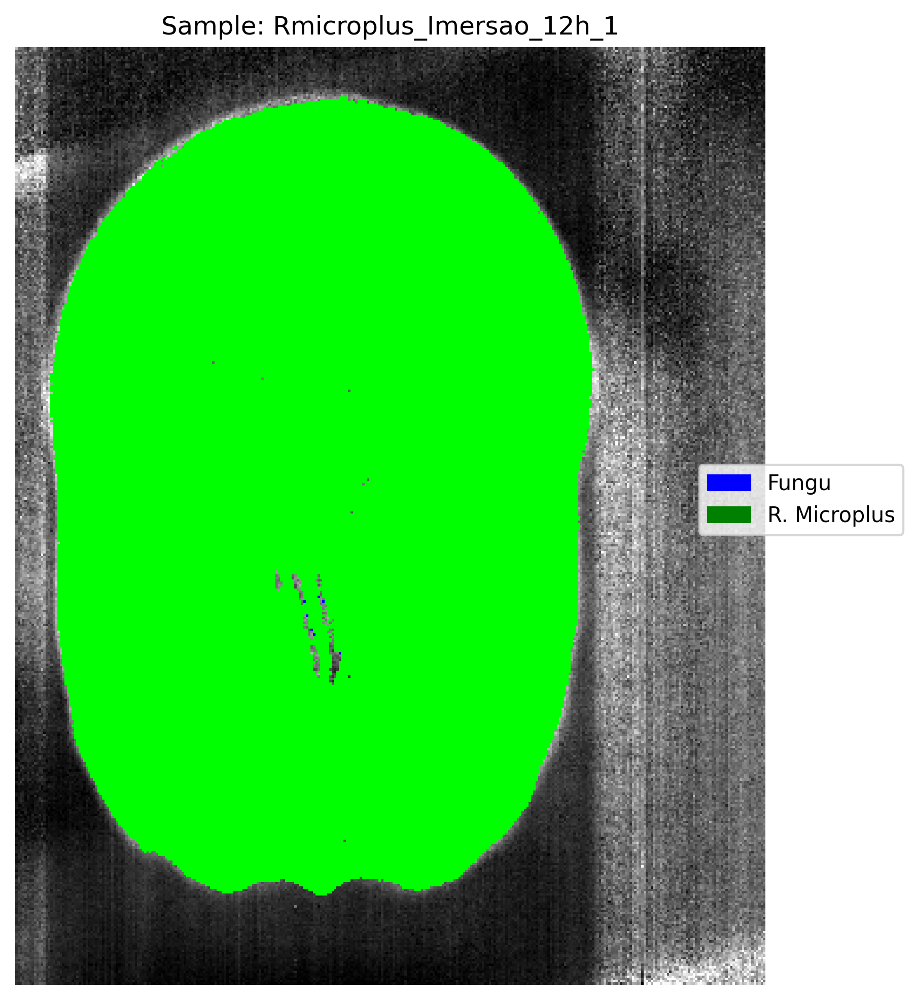

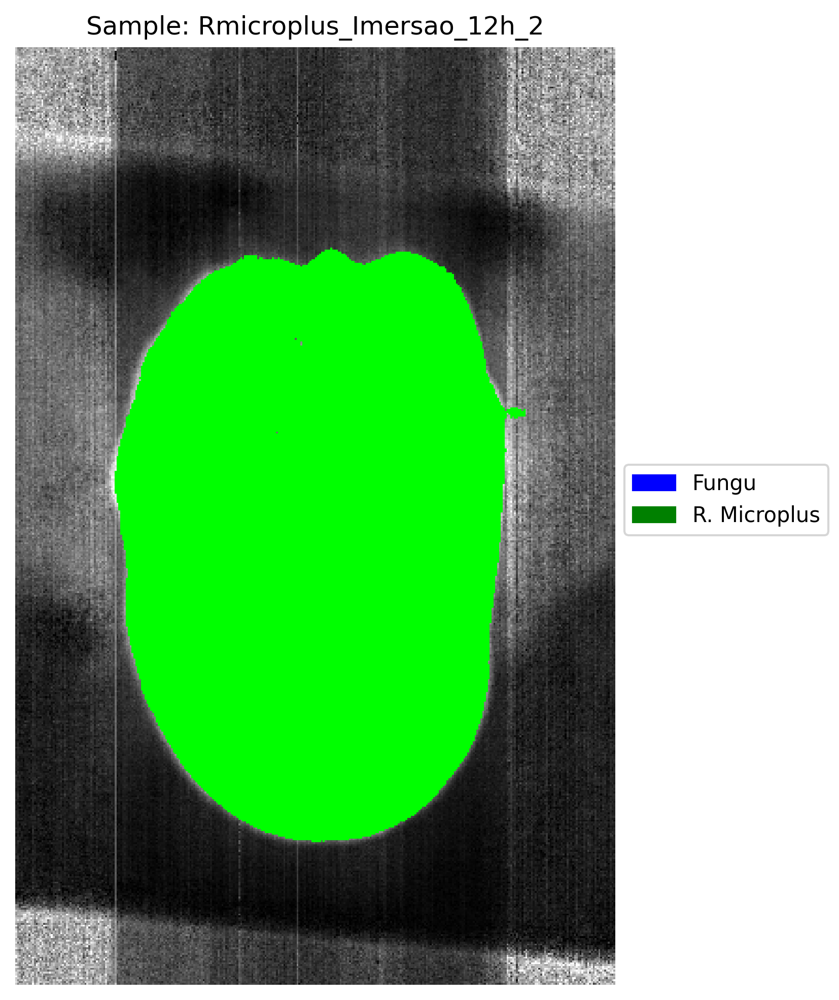

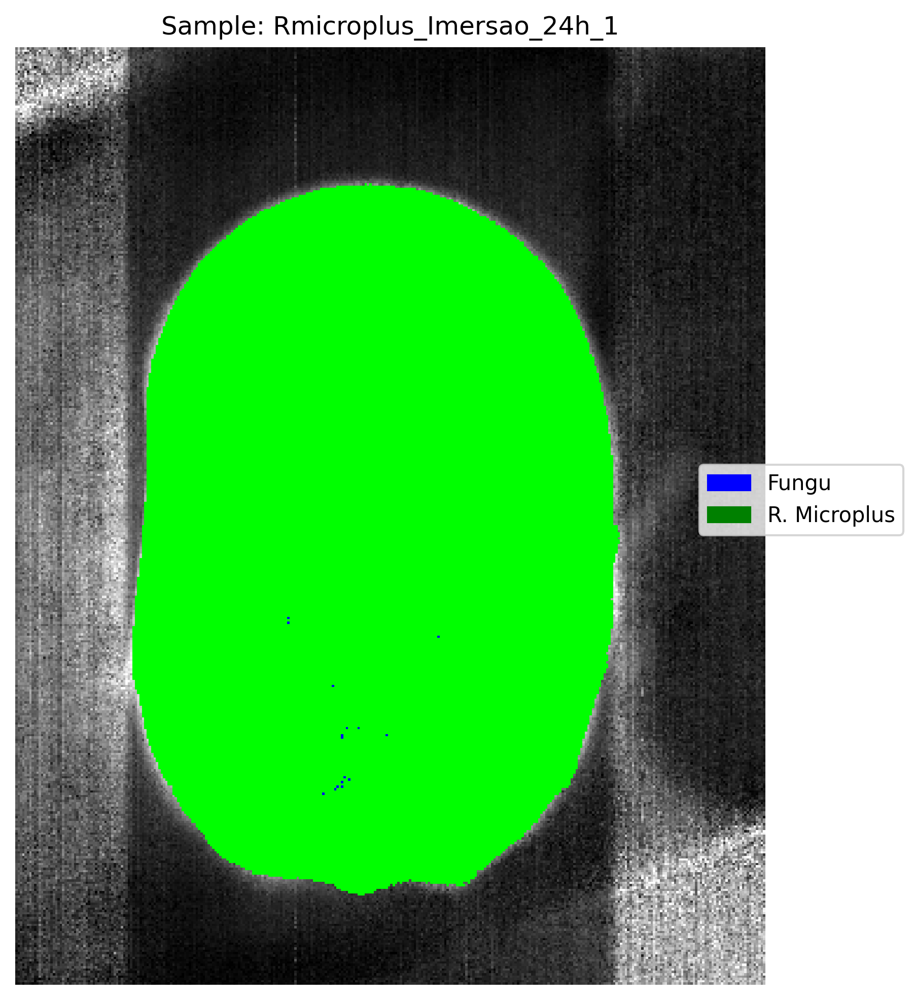

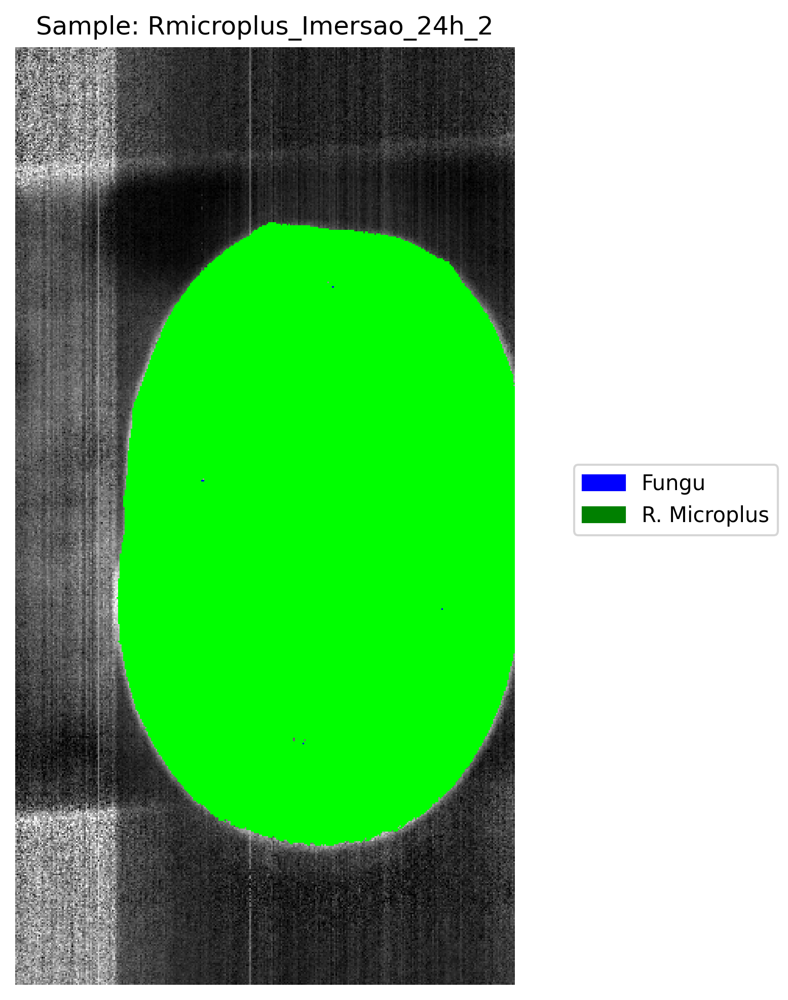

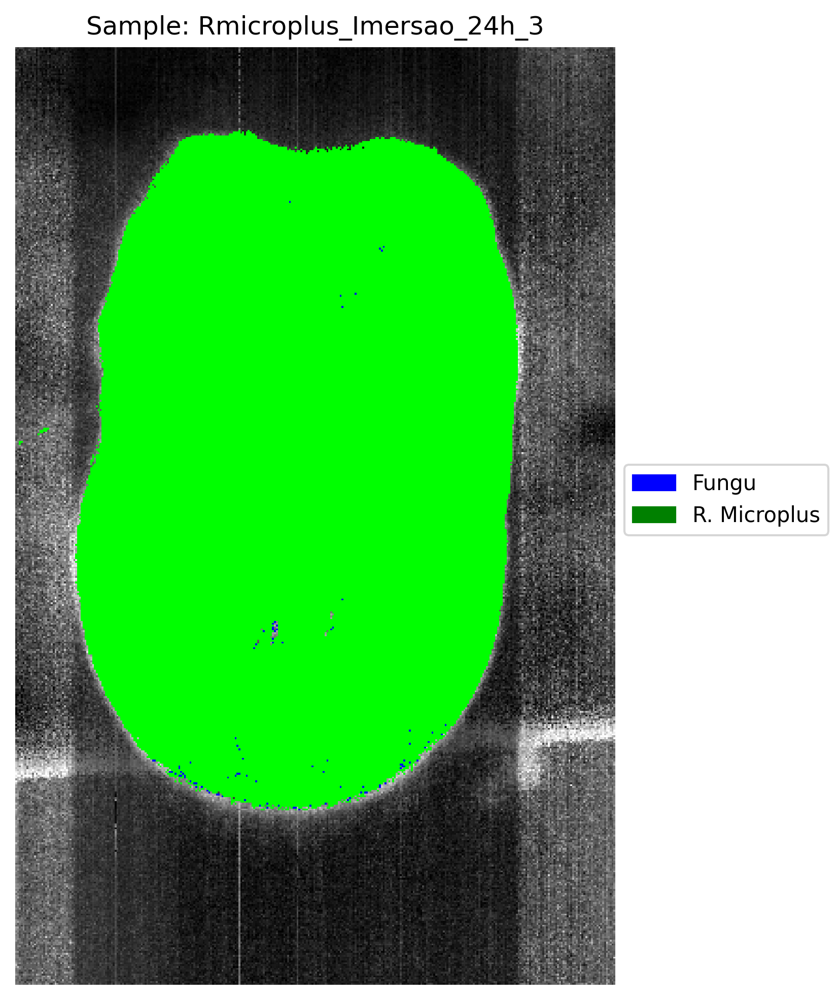

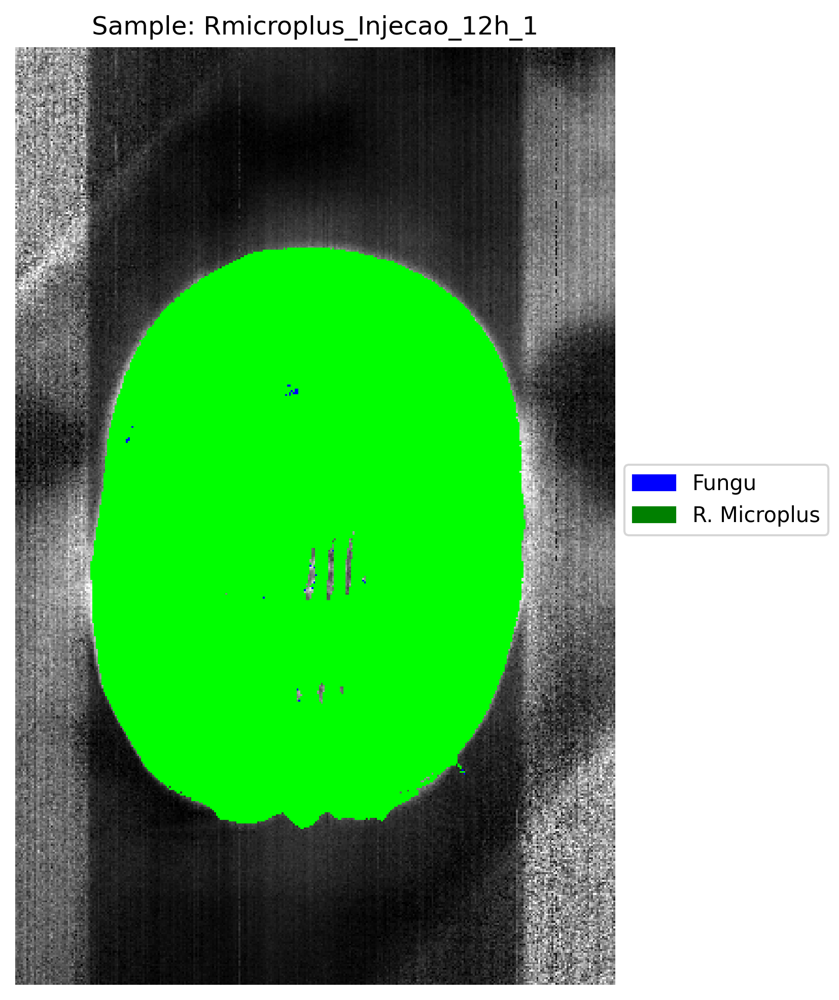

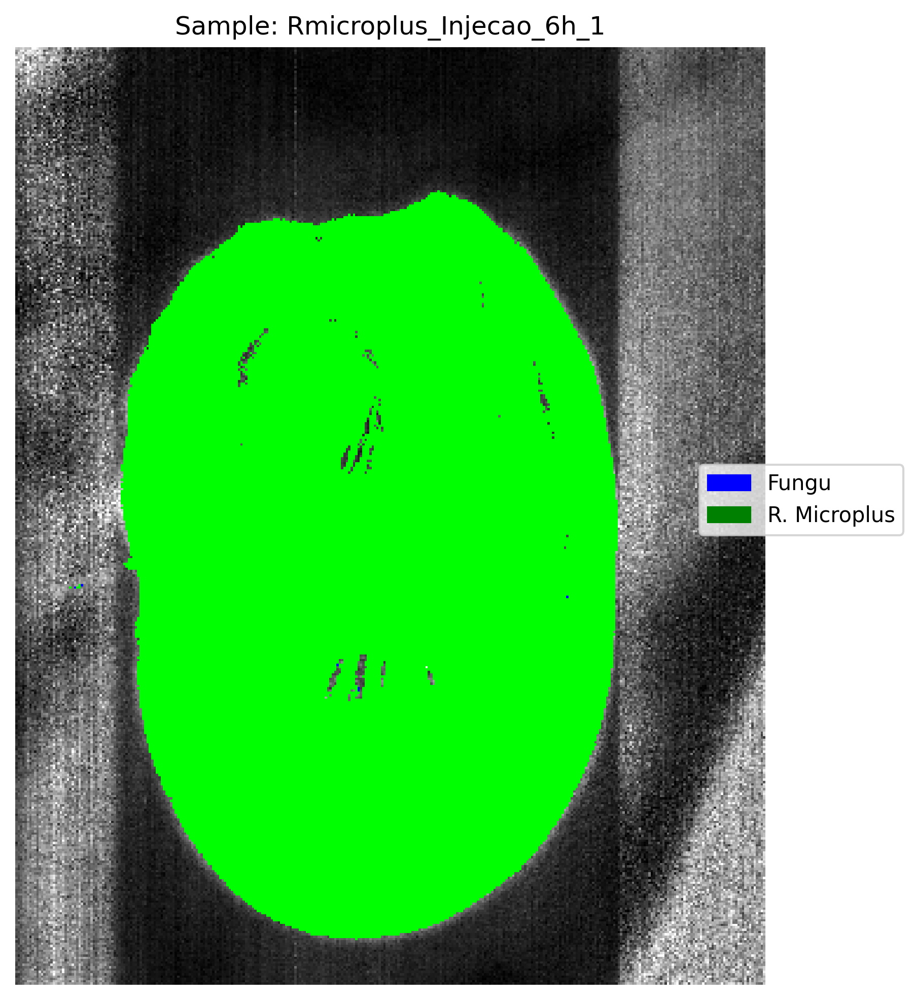

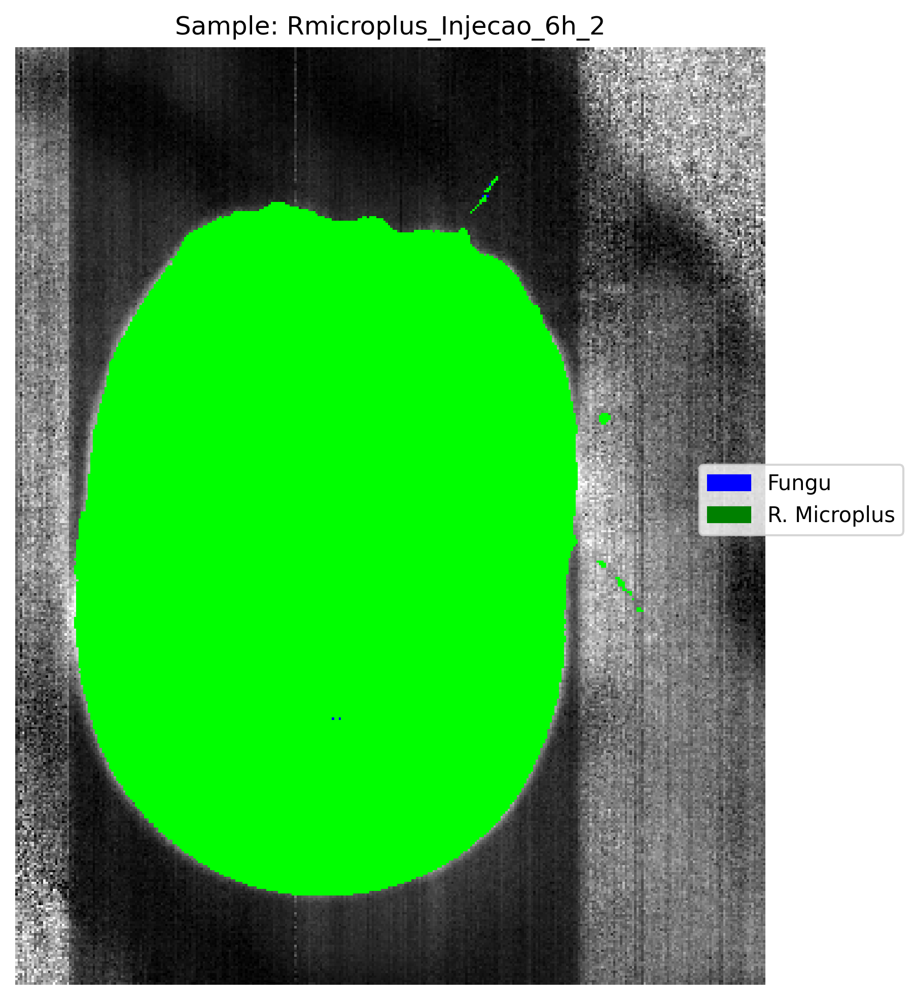

In [105]:
aux = result_visualization(samples_data, samples_list_clusters, dict_models['LinearSVM']['model'])
# aux2 = result_visualization_teste(data_casca_maca, sample_cluster_mc, X_test_mc, '')